# Entregable 1 solución



Project: BMW

Grupo: Miroslavna Kovylina Zabyako, Dácil Talón Ramírez, Javier Arderiu, Javier González Medina, Miguel Benítez Montesinos

## Importe de librerias

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score

## Funciones que se van a usar

### Valores únicos (f1)

In [91]:
def print_unique_value_counts(df, sort_by_value=True):
    """
    Imprime los valores únicos y sus conteos para cada columna en el DataFrame.
    
    Parámetros:
    - df (pd.DataFrame): El DataFrame a analizar.
    - sort_by_value (bool): Si es True, ordena los conteos por los valores; 
                             si es False, ordena por el conteo (por defecto es True).
    
    Retorna:
    - None
    """
    # Imprimir valores únicos para cada columna
    print("Valores únicos:")
    for col in df.columns:
        unique_values_count = len(df[col].unique())
        unique_values = df[col].unique()
        print(f"\n{col}: {unique_values_count} valores únicos\n{unique_values}")

    # Imprimir conteos de valores para cada columna
    print("\nConteos de valores:")
    if sort_by_value:
        value_sort = "Value"
    else:
        value_sort = "Count"
    # Para cada columna, calcular y mostrar los conteos de valores
    for col in df.columns:
        value_counts = (df[col]
                        .value_counts(dropna=False)
                        .rename_axis("Value")
                        .reset_index(name="Count")
                        .sort_values(by=value_sort, ascending=False)
                        )
    # Imprimir los resultados
        print(f"\nColumna: {col}")
        print(value_counts)

       

### Columnas con pocos valores nulos (f2)

In [92]:
def imprimir_cols_few_nan(df, umbral=10):
    """
    Imprime información sobre las columnas de un DataFrame que contienen pocos valores nulos (NaN) 
    y muestra las filas correspondientes que tienen valores NaN en esas columnas.

    Parámetros:
    df (pd.DataFrame): El DataFrame en el que se buscarán las columnas con pocos valores nulos.
    umbral (int, opcional): El número máximo de valores nulos permitidos en una columna para considerarla como 'poco nula'. El valor predeterminado es 10.

    Retorna:
    - Una lista de nombres de columnas que tienen menos de 'umbral' valores nulos y más de 0.
    - La suma total de valores nulos en estas columnas.
    """
    # Identificar columnas con menos de 'umbral' NaNs y más de 0 NaNs
    columns_with_few_nans = df.columns[(df.isnull().sum() < umbral) & (df.isnull().sum() > 0)]
    
    # Imprimir el número de columnas encontradas y los nombres de las columnas
    print(f"\n{len(columns_with_few_nans)} columns with few NaN: {columns_with_few_nans.tolist()}")
    
    # Inicializar una variable para acumular el total de NaNs
    total_nans = 0

    # Iterar sobre cada columna para imprimir las filas con valores nulos
    for col in columns_with_few_nans:
        slice_df = df[df[col].isnull()]
        num_nans = slice_df.shape[0]
        total_nans += num_nans
        print(f"\nColumn: {col}, Number of rows with NaN: {slice_df.shape[0]}")
        # Convertir a cadena con una longitud de línea amplia
        print(slice_df.to_string(index=False, line_width=500))
    
    # Imprimir la suma total de NaNs en las columnas con pocos NaNs
    print(f"\nTotal NaNs in columns with fewer than {umbral} NaNs: {total_nans}")
    
    return columns_with_few_nans.tolist(),total_nans

### Rellenar los valores nulos en las columnas utilizando el valor más frecuente, agrupado por una columna específica (f3)

In [93]:
def fill_na_with_group_mode(df, group_col, fill_col):
    """
    Rellena los valores NaN en la columna `fill_col` con el valor más frecuente dentro de cada grupo
    definido por `group_col`. Si no hay moda para un grupo, se usa la moda de toda la columna.

    Parámetros:
    df (pd.DataFrame): El DataFrame en el que se rellenarán los valores NaN.
    group_col (str): El nombre de la columna por la que se agrupará el DataFrame.
    fill_col (str): El nombre de la columna en la que se rellenarán los valores NaN.

    Retorna:
    pd.DataFrame: El DataFrame con los valores NaN rellenados.
    """
    
    # Calcular la moda global de la columna
    global_mode = df[fill_col].mode()
    global_mode = global_mode[0] if not global_mode.empty else pd.NA
    
    # Obtener los valores más frecuentes para cada grupo
    mode_df = (df
                 .groupby(group_col)
                 [fill_col]
                 .agg(lambda x: x.mode()[0] if not x.mode().empty else global_mode)
                 .reset_index()
               )
    mode_df.columns = [group_col, f'{fill_col}_mode']
    
    # Unir los valores de modo al DataFrame original
    df = df.merge(mode_df, on=group_col, how='left')
    
    # Rellenar los valores NaN en `fill_col` con el modo correspondiente
    df[fill_col] = df[fill_col].fillna(df[f'{fill_col}_mode'])
    
    # Eliminar la columna de modos después de la imputación
    df.drop(columns=[f'{fill_col}_mode'], inplace=True)
    
    return df

### Crear listas de columnas agrupadas por su tipo de dato (f4)

In [94]:
def obtener_lista_variables(df, target):
    """
    Crea listas de tipos de columnas en un DataFrame, excluyendo las columnas objetivo.

    Parámetros:
    - df (pd.DataFrame): El DataFrame a analizar.
    - target (str o lista): El nombre de la columna objetivo o una lista de nombres de columnas objetivo para excluir del análisis.

    Retorna:
    - lista_numericas (list): Lista de nombres de columnas numéricas.
    - lista_boolean (list): Lista de nombres de columnas booleanas.
    - lista_categoricas (list): Lista de nombres de columnas categóricas.
    """
    if isinstance(target, str):
        target = [target]
    elif not isinstance(target, list):
        raise ValueError("El parámetro 'target' debe ser una cadena o una lista de cadenas.")
    
    # Seleccionar columnas booleanas, excluyendo las especificadas en target
    lista_boolean = df.select_dtypes(include="bool").columns.difference(target).tolist()

    # Seleccionar columnas numéricas, excluyendo las especificadas en target
    lista_numericas = df.select_dtypes(include="number").columns.difference(target).tolist()

    # Seleccionar columnas categóricas, excluyendo las especificadas en target
    lista_categoricas = df.select_dtypes(include=["object", "category"]).columns.difference(target).tolist()

    # Imprimir las listas resultantes
    print(f"Lista numéricas: {lista_numericas}")
    print(f"Lista categóricas: {lista_categoricas}")
    print(f"Lista booleanas: {lista_boolean}")

    return lista_numericas, lista_categoricas, lista_boolean

### Dibujar un histograma o un gráfico de barras para comparar la distribución de los datos antes y después de rellenar los valores nulos (f5)

In [95]:
def plot_before_after_sns(df1, df2, col, use_seaborn, bin_size, kde_on, plot_type='hist'):
    """
    Dibuja histogramas o gráficos de barras comparando una columna de dos DataFrames, antes y después de rellenar valores NaN.

    Parámetros:
    - df1 (pd.DataFrame): DataFrame antes de aplicar fillna.
    - df2 (pd.DataFrame): DataFrame después de aplicar fillna.
    - col (str): Nombre de la columna a graficar.
    - use_seaborn (bool): Si es True, usa seaborn para graficar; si es False, usa matplotlib.
    - bin_size (int): Número de bins para el histograma.
    - kde_on (bool): Si es True, grafica el Kernel Density Estimate (KDE) sobre el histograma.
    - plot_type (str): Tipo de gráfico a generar ('hist' para histograma, 'bar' para gráfico de barras).

    Retorna:
    - None
    """

    # Crear una figura con dos subgráficos en una fila
    fig, axes = plt.subplots(nrows=1, ncols=2, dpi=600, figsize=(10, 3))
    
    # Configurar los datos para antes y después de aplicar fillna
    data = {
        'Before fillna': {"color": "blue", "values": df1[col]},
        'After fillna': {"color": "green", "values": df2[col]},
    }
    
    # Iterar sobre los subgráficos y los datos configurados
    for ax, (title, data_values) in zip(axes, data.items()):
        if plot_type == 'hist':
            if use_seaborn:
                # Graficar histograma usando seaborn
                sns.histplot(data=data_values["values"], bins=bin_size, ax=ax, color=data_values["color"], alpha=0.7, kde=kde_on)
            else:
                # Graficar histograma usando matplotlib
                ax.hist(data_values["values"], bins=bin_size, color=data_values["color"], alpha=0.7)
            ax.set_ylabel('Frequency', fontsize=8)
        elif plot_type == 'bar':
            # Calcular la distribución de frecuencias para el gráfico de barras
            value_counts = data_values["values"].value_counts().sort_index()
            if use_seaborn:
                # Graficar gráfico de barras usando seaborn
                sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax, color=data_values["color"])
            else:
                # Graficar gráfico de barras usando matplotlib
                ax.bar(value_counts.index, value_counts.values, color=data_values["color"], alpha=0.7)
            ax.set_ylabel('Count', fontsize=8)
        
        # Configurar los títulos y etiquetas de los gráficos
        ax.set_title(title, fontsize=10)
        ax.set_xlabel(col, fontsize=8)
        ax.tick_params(labelsize=8)
    
    # Ajustar el layout para evitar solapamientos y mostrar la figura
    plt.tight_layout()
    plt.show()

### Crear una distribución sintética para rellenar los datos con números aleatorios, con el fin de mantener la forma de la distribución original (f6)

In [96]:
def fill_na_with_synthetic_data(df, col):
    """
    Rellena los valores NaN en la columna especificada de un DataFrame con datos sintéticos
    basados en la distribución de los datos no nulos en esa columna.
    
    Parámetros:
    df (pd.DataFrame): DataFrame en el que se rellenarán los valores NaN.
    col (str): Nombre de la columna en la que se rellenarán los valores NaN.
    
    Retorna:
    pd.DataFrame: DataFrame con los valores NaN rellenados con datos sintéticos.
    """
    
    # Calcular frecuencias de valores no nulos en la columna
    frequencies = df[col].value_counts(normalize=True)
    
    # Función para generar datos sintéticos
    def generate_synthetic_data(n, categories, probabilities):
        return np.random.choice(categories, size=n, p=probabilities)
    
    # Obtener el número de valores faltantes
    n_missing = df[col].isna().sum()
    
    if n_missing == 0:
        print(f"No hay valores NaN en la columna {col}.")
        return df
    
    # Generar datos sintéticos
    categories = frequencies.index
    probabilities = frequencies.values
    synthetic_data = generate_synthetic_data(n=n_missing, categories=categories, probabilities=probabilities)
    
    # Rellenar los valores nulos con los datos sintéticos
    df[col] = df[col].fillna(pd.Series(synthetic_data, index=df.index[df[col].isna()]))
    
    return df

### Identificar y convertir las columnas booleanas en Int8 (f7)

In [97]:
def identify_convert_boolean_columns(df):
    """
    Identifica las columnas categóricas que contienen valores booleanos en un DataFrame y las convierte a tipo int8.

    Parámetros:
    df (pd.DataFrame): El DataFrame a analizar.

    Retorna:
    pd.DataFrame: El DataFrame con las columnas categóricas booleanas convertidas a tipo int8.
    """
    # Seleccionar las columnas categóricas y booleanas
    categorical_columns = df.select_dtypes(include=['object', 'bool']).columns
    
    # Identificar las columnas categóricas que son booleanas
    boolean_columns = [col for col in categorical_columns if df[col].isin([True, False]).all()]
    
    # Convertir las columnas booleanas a tipo int8
    df[boolean_columns] = df[boolean_columns].astype('int8')
    
    return df

### Análisis de datos numéricos (f8)

In [98]:
def analizar_columnas_numericas(df, lista_numericas, include_binarios=True, bin_size=10, kde_on=True):
    """
    Analiza columnas numéricas en un DataFrame y proporciona estadísticas descriptivas, distribución, 
    valores únicos, y visualizaciones utilizando Seaborn.

    Parámetros:
    - df (pd.DataFrame): El DataFrame a analizar.
    - lista_numericas (list): Lista de nombres de columnas numéricas a analizar.
    - include_binarios (bool): Indica si se deben incluir columnas binarias (numéricas con 2 valores únicos) en el análisis.
    - bin_size (int): Número de bins para los histogramas.
    - kde_on (bool): Indica si se debe incluir la estimación de densidad (kde) en los histogramas.

    Retorna:
    - None
    """
    # Filtrar columnas con más de 2 valores únicos y columnas con exactamente 2 valores únicos
    cols_gt2_unicos = [col for col in lista_numericas if df[col].nunique() > 2]
    cols_2_unicos = [col for col in lista_numericas if df[col].nunique() == 2]
    
    # Estadísticas descriptivas
    print("Estadísticas descriptivas:")
    if include_binarios:
        print(df[cols_gt2_unicos + cols_2_unicos].describe().round(2), "\n")
    else:
        print(df[cols_gt2_unicos].describe().round(2), "\n")

    # Valores únicos
    print("Número de valores únicos por columna:")
    if include_binarios:
        print(df[cols_gt2_unicos + cols_2_unicos].nunique(), "\n")
    else:
        print(df[cols_gt2_unicos].nunique(), "\n")

    # Boxplots para columnas numéricas con más de 2 valores
    if cols_gt2_unicos:
        plt.figure(figsize=(6, 3 * len(cols_gt2_unicos)))
        for i, col in enumerate(cols_gt2_unicos):
            plt.subplot(len(cols_gt2_unicos), 1, i + 1)
            sns.boxplot(data=df, x=col)
            plt.title(f'Boxplot de {col}', fontsize=12)
            plt.xlabel(col, fontsize=10)
        plt.tight_layout()
        plt.show()
    else:
        print("No hay columnas numéricas con más de 2 valores únicos para mostrar boxplots.\n")
    
    # Histogramas para columnas numéricas con más de 2 valores
    if cols_gt2_unicos:
        print("Histogramas para columnas numéricas con más de 2 valores:")
        plt.figure(figsize=(6, 3 * len(cols_gt2_unicos)))
        for i, col in enumerate(cols_gt2_unicos):
            plt.subplot(len(cols_gt2_unicos), 1, i + 1)
            sns.histplot(df[col], bins=bin_size, kde=kde_on, color='blue', alpha=0.7)
            plt.title(f'Histograma de {col}', fontsize=12)
            plt.xlabel(col, fontsize=10)
        plt.tight_layout()
        plt.show()
    else:
        print("No hay columnas numéricas con más de 2 valores únicos para mostrar histogramas.\n")

    # Barplots para columnas numéricas con exactamente 2 valores únicos
    if cols_2_unicos and include_binarios:
        print("Barplots para columnas numéricas con exactamente 2 valores únicos:")
        plt.figure(figsize=(4, 2* len(cols_2_unicos)))
        for i, col in enumerate(cols_2_unicos):
            plt.subplot(len(cols_2_unicos), 1, i + 1)
            sns.barplot(x=df[col].value_counts().index, y=df[col].value_counts().values, color='blue')
            plt.title(f'Barplot de {col}', fontsize=12)
            plt.xlabel(col, fontsize=10)
            plt.ylabel('Frecuencia', fontsize=10)
        plt.tight_layout()
        plt.show()
    
    # Matriz de correlación
    print("Matriz de correlación:")
    if include_binarios:
        correlacion = df[cols_gt2_unicos + cols_2_unicos].corr().round(2)
    else:
        correlacion = df[cols_gt2_unicos].corr().round(2)
    print(correlacion)

    # Mapa de calor para la matriz de correlación
    plt.figure(figsize=(7, 6))
    sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title("Mapa de Calor de Correlación", fontsize=14)
    plt.show()

### Rellenar los valores menores que un umbral en las columnas utilizando la media, mediana o moda, agrupado por una columna específica (f9)

In [99]:
def fill_values_below_threshold(df, group_col, target_col, threshold, method='mean'):
    """
    Rellena los valores en target_col menores que el umbral (threshold) con la media, moda o mediana
    calculados agrupando por group_col. Los valores menores del umbral no se tienen en cuenta para calcular estos valores.
    :param df: DataFrame a procesar.
    :param group_col: Columna por la que se agrupan los datos.
    :param target_col: Columna cuyos valores se quieren rellenar.
    :param threshold: Umbral por debajo del cual se rellenarán los valores.
    :param method: Método para rellenar los valores: 'mean', 'median' o 'mode'.
    :return: DataFrame con los valores rellenados.
    """

    # Filtrar los datos para calcular los valores de referencia excluyendo los valores menores del umbral
    df_filtered = df[df[target_col] >= threshold]
    
    # Calcular los valores globales de referencia para la columna target_col
    if method == 'mean':
        global_ref = df_filtered[target_col].mean()
        # Calcular la media por grupo y usar el valor global si el grupo no tiene datos
        ref_values = df_filtered.groupby(group_col)[target_col].mean().reindex(df[group_col].unique(), fill_value=global_ref)
    elif method == 'median':
        global_ref = df_filtered[target_col].median()
        # Calcular la mediana por grupo y usar el valor global si el grupo no tiene datos
        ref_values = df_filtered.groupby(group_col)[target_col].median().reindex(df[group_col].unique(), fill_value=global_ref)
    elif method == 'mode':
        # Calcular la moda global para asegurar que hay un valor predeterminado
        global_mode = df_filtered[target_col].mode().iloc[0] if not df_filtered[target_col].mode().empty else np.nan
        
        # Calcular la moda por grupo y usar la moda global si el grupo no tiene moda
        def get_mode(series):
            mode_series = series.mode()
            return mode_series.iloc[0] if not mode_series.empty else global_mode
        
        ref_values = df_filtered.groupby(group_col)[target_col].apply(get_mode).reindex(df[group_col].unique(), fill_value=global_mode)
    else:
        raise ValueError("El método debe ser 'mean', 'median' o 'mode'")

    # Crear una máscara para los valores que necesitan ser rellenados
    mask = (df[target_col] < threshold) | (df[target_col].isna())

    # Rellenar los valores utilizando la máscara y mapeando los valores de referencia
    if not ref_values.empty:
        df.loc[mask, target_col] = df.loc[mask, group_col].map(ref_values)
    else:
        df.loc[mask, target_col] = global_ref if method in ['mean', 'median'] else global_mode
    
    return df

### Análisis de datos categoricos (f10)

In [100]:
def analizar_categoricas(df, columnas, plot_distribution=True, sort_by_frequency=True, fig_size=(7, 5)):
    """
    Analiza variables categóricas en un DataFrame e incluye gráficos para la distribución de valores.
    
    Parameters:
    - df (pd.DataFrame): DataFrame que contiene las variables a analizar.
    - columnas (list): Lista de nombres de columnas categóricas a analizar.
    - plot_distribution (bool): Indica si se deben mostrar gráficos de distribución de valores. (default=True)
    - sort_by_frequency (bool): Define si los valores en los gráficos de distribución deben ordenarse por frecuencia. (default=True)
    - figsize_distribution (tuple): Tamaño de la figura para los gráficos de distribución. (default=(7, 5))
    
    Returns:
    - None: Imprime el análisis y muestra gráficos.
    """
    
    # Imprimir el análisis de conteo de todas las columnas
    print("Resumen de variables categóricas:")
    distribuciones = {}
    
    for col in columnas:
        if col in df.columns:
            # Imprimir todos los valores únicos
            valores_unicos = df[col].unique()
            print(f"\nValores únicos en la columna '{col}':")
            print(valores_unicos)
            
            # Conteo de valores únicos
            num_unicos = df[col].nunique()
            distribucion = df[col].value_counts(dropna=False)
            distribuciones[col] = distribucion
            
            # Calcular porcentajes
            porcentajes = (distribucion / distribucion.sum() * 100).round(1)
            
            print(f"\nAnálisis para la columna '{col}':")
            print(f"Número de valores únicos: {num_unicos}")
            
            # Mostrar distribución de valores con porcentajes
            distribucion_completo = pd.DataFrame({
                'Conteo': distribucion,
                'Porcentaje (%)': porcentajes
            })
            print(f"Distribución de valores:\n{distribucion_completo}\n")
        else:
            print(f"La columna '{col}' no se encuentra en el DataFrame.")
    
    # Mostrar gráficos de barras (histograma) de distribución de valores
    if plot_distribution:
        for col, distribucion in distribuciones.items():
            plt.figure(figsize=fig_size)
            if sort_by_frequency:
                order = distribucion.index
            else:
                order = None
            sns.countplot(data=df, x=col, order=order, color="blue")
            plt.title(f'Distribución de valores en la columna {col}', fontsize=12)
            plt.xlabel(col, fontsize=10)
            plt.ylabel('Frecuencia', fontsize=10)
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

### Categorizar modelos coches (f11)

In [101]:
def categorizar_modelos(df, columna_modelos):
    """
    Categoriza una columna de modelos de automóviles en función de las series y tipos,
    y agrega una columna de categorías al DataFrame. También identifica modelos no categorizados.
    
    Parameters:
    - df (pd.DataFrame): DataFrame que contiene una columna de modelos a categorizar.
    - columna_modelos (str): Nombre de la columna en df que contiene los modelos de automóviles.
    
    Returns:
    - pd.DataFrame: DataFrame con una columna de categorías añadida y la columna de modelos eliminada.
    - list: Lista de modelos no categorizados.
    """
    # Definir las categorías
    categorias = {
        'Serie 1': ['118', '120', '123','125', '135', '116', '114'],
        'Serie 2': ['220', '218', '225', '214', '216','216 Gran Tourer','216 Active Tourer',' Active Tourer'],
        'Serie 3': ['316','320', '325', '328', '330', '335', '318', '320 Gran Turismo', '318 Gran Turismo', '335 Gran Turismo'],
        'Serie 4': ['420', '425', '430', '435', '420 Gran Coupé', '430 Gran Coupé', '435 Gran Coupé','418 Gran Coupé'],
        'Serie 5': ['520', '523','525', '530', '535', '518', '528', '535 Gran Turismo', 'ActiveHybrid 5'],
        'Serie 6': ['640', '640 Gran Coupé', '635', '630', '650','Z4'],
        'Serie 7': ['730', '740', '750', '735'],
        'Serie 8': ['i8'],
        'SUV': ['X1', 'X3', 'X4', 'X5', 'X6', 'X7', 'X5 M', 'X6 M', 'X5 M50'],
        'Electric': ['i3', 'i4'],
        'M': ['M4', 'M3', 'M235', 'M550', 'M135', 'M5']
    }
    
    # Asegurarse de que la columna de modelos existe en el DataFrame
    if columna_modelos not in df.columns:
        raise ValueError(f"La columna '{columna_modelos}' no se encuentra en el DataFrame.")
    
    # Crear una nueva columna 'modelo_categoria' en el DataFrame
    df['modelo_categoria'] = 'Desconocida'
    
    # Asignar categorías
    for categoria, lista_modelos in categorias.items():
        for modelo in lista_modelos:
            df.loc[df[columna_modelos].str.contains(modelo, na=False), 'modelo_categoria'] = categoria
    
    # Identificar modelos desconocidos
    modelos_desconocidos = df[df['modelo_categoria'] == 'Desconocida'][columna_modelos].unique()
    
    # Eliminar la columna de modelos
    df = df.drop(columns=[columna_modelos])
    
    return df, modelos_desconocidos.tolist()

### Reducir categorias (f12)

In [102]:
def reducir_categorias(df, columnas, umbral_porcentaje=1.0):
    """
    Reduce las categorías en columnas específicas que tienen una frecuencia baja.
    
    Parameters:
    - df (pd.DataFrame): DataFrame que contiene las variables a reducir.
    - columnas (list): Lista de nombres de columnas categóricas a reducir.
    - umbral_porcentaje (float): Porcentaje mínimo de frecuencia para mantener la categoría (default=1.0).
    
    Returns:
    - pd.DataFrame: DataFrame con columnas categóricas reducidas.
    """
    
    for col in columnas:
        if col in df.columns:
            # Calcular porcentajes de cada categoría
            distribucion = df[col].value_counts(normalize=True) * 100
            categorias_replace = distribucion[distribucion < umbral_porcentaje].index
            
            # Reemplazar categorías con menos del umbral por 'Otros'
            df[col] = df[col].replace(categorias_replace, 'Otros')
    
    return df

### Visualizar correlacion (f13)

In [103]:
def visualizar_correlacion(df, columnas_numericas, fig_width=10, fig_height=8, cmap='coolwarm', max_columns=40):
    """
    Calcula la matriz de correlación entre las variables numéricas y la visualiza usando un mapa de calor.

    Args:
        df (pd.DataFrame): El DataFrame que contiene los datos.
        columnas_numericas (list): Lista de nombres de columnas numéricas para calcular la correlación.
        fig_width (int): Ancho de la figura para la visualización. Predeterminado a 10.
        fig_height (int): Altura de la figura para la visualización. Predeterminado a 8.
        cmap (str): El esquema de colores para el mapa de calor. Predeterminado a 'coolwarm'.
        max_columns (int): Número máximo de columnas a visualizar en el mapa de calor.

    Returns:
        corr (pd.DataFrame): La matriz de correlación calculada.
    """
    # Configurar la cantidad máxima de columnas a mostrar
    pd.set_option('display.max_columns', max_columns)

    # Verificar que las columnas numéricas existen en el DataFrame
    for col in columnas_numericas:
        if col not in df.columns:
            raise ValueError(f"La columna '{col}' no se encuentra en el DataFrame.")
    
    # Calcular la matriz de correlación
    corr = df[columnas_numericas].corr().round(2)
    
    # Configurar el tamaño de la figura para la visualización
    plt.figure(figsize=(fig_width, fig_height))
    
    # Crear y mostrar un mapa de calor (heatmap) con la matriz de correlación
    sns.heatmap(corr, annot=True, cmap=cmap, fmt='.2f', linewidths=0.5)
    
    # Mostrar la gráfica
    plt.show()
    
    return corr

### Calcular y visualizar el coeficiente de correlación Cramér's (f14)

In [104]:
def calcular_y_visualizar_cramers_v(df, lista_categoricas):
    """
    Calcula y visualiza el coeficiente de correlación Cramér's V entre las variables categóricas
    en un DataFrame.

    Args:
    df (DataFrame): El DataFrame que contiene las variables categóricas.
    lista_categoricas (list): Lista de nombres de columnas categóricas en el DataFrame.

    Returns:
    cramers_v_df (DataFrame): DataFrame con los coeficientes de Cramér's V para cada par de variables categóricas.
    """
    
    def cramers_v(x, y):
        """Calcula el coeficiente de correlación Cramér's V entre dos variables categóricas."""
        # Crear una tabla de contingencia
        contingency_table = pd.crosstab(x, y)
        # Realizar el test chi-cuadrado
        chi2, _, _, _ = chi2_contingency(contingency_table)
        # Número de observaciones
        n = contingency_table.sum().sum()
        # Número de categorías en la variable con menos categorías
        k = min(contingency_table.shape)
        # Calcular el coeficiente de Cramér's V
        return (np.sqrt(chi2 / (n * (k - 1)))).round(3)
    
    # Crear un DataFrame para almacenar los resultados
    cramers_v_df = pd.DataFrame(index=lista_categoricas, columns=lista_categoricas)

    # Calcular el coeficiente de Cramér's V para cada par de variables categóricas
    for var1 in lista_categoricas:
        for var2 in lista_categoricas:
            cramers_v_df.loc[var1, var2] = cramers_v(df[var1], df[var2])

    # Convertir los valores a float para evitar problemas de visualización
    cramers_v_df = cramers_v_df.astype(float)

    # Mostrar la tabla de resultados
    print("Coeficiente de Cramér's V entre variables categóricas:")
    print(cramers_v_df)

    # Visualizar los resultados en un heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(cramers_v_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, square=True)
    plt.title('Coeficiente de Correlación Cramér\'s V entre Variables Categóricas')
    plt.show()
    
    return cramers_v_df

### Crear y mostrar scatter plots en dos columnas (f15)

In [105]:
def crear_scatter_plots_log(df, columnas,target_list, hue_columnas):
    """
    Crea y muestra scatter plots en dos columnas:
    - La primera columna muestra la distribución de la primera variable objetivo en función de las columnas categóricas y booleanas.
    - La segunda columna muestra la distribución de la segunda variable objetivo en función de las mismas columnas categóricas y booleanas.

    Parameters:
    - df (pd.DataFrame): El DataFrame que contiene los datos.
    - columnas: Lista de nombres de columnas categóricas y booleanas.
    - target_list (list): Lista de nombres de columnas de variables objetivo continuas. Debe contener exactamente dos elementos.
    - hue_columnas: Lista de columnas para usar como hue.
    
    Returns:
    - None
    """
    if len(target_list) != 2:
        raise ValueError("target_list debe contener exactamente dos variables objetivo.")
    
    num_columnas = len(columnas)
    hue_length = len(hue_columnas)
    total_plots = num_columnas * hue_length * 2  # 2 plots (target_list) for each combination
    num_filas = (total_plots + 1) // 2
    
    # Crear una figura con subplots
    fig, axes = plt.subplots(num_filas, 2, figsize=(15, 5 * num_filas))
    
    # Ajustar la disposición de los subplots
    axes = axes.flatten()
    
    # Crear gráficos de scatterplot para cada columna numerica aplicando hue=categoricas
    plot_index = 0
    for hue in hue_columnas:
        for col in columnas:
            if col != hue:
                # Primer target
                sns.scatterplot(ax=axes[plot_index], x=col, y=target_list[0], data=df, hue=hue)
                axes[plot_index].set_title(f'{target_list[0]} por {col} (hue={hue})')
                axes[plot_index].set_xlabel(col)
                axes[plot_index].set_ylabel(target_list[0])
                plot_index += 1
        
                # Segundo target
                sns.scatterplot(ax=axes[plot_index], x=col, y=target_list[1], data=df, hue=hue)
                axes[plot_index].set_title(f'{target_list[1]} por {col} (hue={hue})')
                axes[plot_index].set_xlabel(col)
                axes[plot_index].set_ylabel(target_list[1])
                plot_index += 1
    
    plt.tight_layout()
    plt.show()

### Crear y mostrar violín plots en dos columnas (f16)

In [106]:
def crear_violinplot_log(df,columnas, target_list):
    """
    Crea y muestra violín plots en dos columnas:
    - La primera columna muestra la distribución de la primera variable objetivo en función de las columnas categóricas y booleanas.
    - La segunda columna muestra la distribución de la segunda variable objetivo en función de las mismas columnas categóricas y booleanas.

    Parameters:
    - df (pd.DataFrame): El DataFrame que contiene los datos.
    - columnas: Lista de nombres de columnas categóricas y booleanas.
    - target_list (list): Lista de nombres de columnas de variables objetivo continuas. Debe contener exactamente dos elementos.
    
    Returns:
    - None
    """
    if len(target_list) != 2:
        raise ValueError("target_list debe contener exactamente dos variables objetivo.")
    
    num_columnas = len(columnas)
    
    # Crear una figura con subplots
    plt.figure(figsize=(12, 6 * num_columnas))  # Ajustar tamaño según número de columnas
    
    # Crear gráficos de violín para cada columna categórica/booleana
    for i, col in enumerate(columnas):
        plt.subplot(num_columnas, 2, 2 * i + 1)
        sns.violinplot(x=col, y=target_list[0], data=df, )
        plt.title(f'{target_list[0]} por {col}')
        plt.xlabel(col)
        plt.ylabel(target_list[0])
        
        plt.subplot(num_columnas, 2, 2 * i + 2)
        sns.violinplot(x=col, y=target_list[1], data=df)
        plt.title(f'{target_list[1]} por {col}')
        plt.xlabel(col)
        plt.ylabel(target_list[1])
    
    plt.tight_layout()
    plt.show()

### Crear y muestrar box plots en dos columnas para target (f17)

In [107]:
def crear_boxplot_log(df,columnas,target_list):
    """
    Crea y muestra box plots en dos columnas:
    - La primera columna muestra la distribución de la primera variable objetivo en función de las columnas categóricas y booleanas.
    - La segunda columna muestra la distribución de la segunda variable objetivo en función de las mismas columnas categóricas y booleanas.

    Parameters:
    - df (pd.DataFrame): El DataFrame que contiene los datos.
    - columnas: Lista de nombres de columnas categóricas y booleanas.
    - target_list (list): Lista de nombres de columnas de variables objetivo continuas. Debe contener exactamente dos elementos.
    
    Returns:
    - None
    """
    if len(target_list) != 2:
        raise ValueError("target_list debe contener exactamente dos variables objetivo.")
    
    num_columnas = len(columnas)
    
    # Crear una figura con subplots
    plt.figure(figsize=(12, 6 * num_columnas))  # Ajustar tamaño según número de columnas
    
    # Crear gráficos de violín para cada columna categórica/booleana
    for i, col in enumerate(columnas):
        plt.subplot(num_columnas, 2, 2 * i + 1)
        sns.boxplot(x=col, y=target_list[0], data=df, color="blue")
        plt.title(f'{target_list[0]} por {col}')
        plt.xlabel(col)
        plt.ylabel(target_list[0])
        
        plt.subplot(num_columnas, 2, 2 * i + 2)
        sns.boxplot(x=col, y=target_list[1], data=df, color="blue")
        plt.title(f'{target_list[1]} por {col}')
        plt.xlabel(col)
        plt.ylabel(target_list[1])
    
    plt.tight_layout()
    plt.show()

### Análisis del impacto de las variables categóricas sobre la variable numérica objetivo (f18)

In [108]:
def analisis_anova_y_medias_1(df, columnas_categoricas, target_numerico):
    """
    Realiza un análisis de ANOVA para evaluar si hay diferencias significativas en el target numérico
    entre las categorías de cada columna categórica en 'columnas_categoricas', y también calcula
    el valor medio del target numérico para cada categoría en cada columna categórica.
    
    Args:
    df (DataFrame): El DataFrame que contiene los datos.
    columnas_categoricas (list): Lista de nombres de columnas categóricas en el DataFrame.
    target_numerico (str): Nombre de la columna numérica objetivo en el DataFrame.

    Returns:
    resultados_anova (DataFrame): Un DataFrame con los resultados de ANOVA para cada columna categórica.
    medias_por_categoria (dict): Un diccionario con DataFrames que muestran el valor medio del target numérico
                                 para cada categoría en las columnas categóricas.
    rango_medias (dict): Un diccionario con el máximo y mínimo de las medias de precio para cada columna categórica,
                         así como las categorías correspondientes.
    """
    # Crear listas
    resultados = []
    medias_por_categoria = {}
    rango_medias = {}

    for columna_categorizada in columnas_categoricas:
        # Asegúrate de que la columna categórica y el target numérico existen en el DataFrame
        if columna_categorizada not in df.columns or target_numerico not in df.columns:
            raise ValueError(f"Las columnas especificadas '{columna_categorizada}' o '{target_numerico}' no están en el DataFrame.")
        
        # Agrupa los datos por la columna categorizada
        grupos = df.groupby(columna_categorizada)[target_numerico].apply(list)
        
        # Realiza la prueba de ANOVA
        anova_resultado = stats.f_oneway(*grupos)
        
        # Almacena los resultados de ANOVA
        resultados.append({
            'Columna Categórica': columna_categorizada,
            'Valor F': round(anova_resultado.statistic, 4),
            'p-Valor': round(anova_resultado.pvalue, 6)
        })
        
        # Calcula el valor medio del target para cada categoría
        medias = df.groupby(columna_categorizada)[target_numerico].mean().reset_index()
        medias.columns = [columna_categorizada, 'Media Precio']
        medias['Media Precio'] = medias['Media Precio'].round(0).astype(int)  # Redondea y convierte a enteros
        medias_por_categoria[columna_categorizada] = medias
        
        # Calcula el máximo y mínimo de las medias de precio
        max_categoria = medias.loc[medias['Media Precio'].idxmax()]
        min_categoria = medias.loc[medias['Media Precio'].idxmin()]
        rango_medias[columna_categorizada] = {
            'Max Media Precio': max_categoria['Media Precio'],
            'Categoria Max': max_categoria[columna_categorizada],
            'Min Media Precio': min_categoria['Media Precio'],
            'Categoria Min': min_categoria[columna_categorizada]
        }
    
    # Crear un DataFrame con los resultados de ANOVA
    resultados_anova = pd.DataFrame(resultados)
    
    # Mostrar resultados de ANOVA
    print("Resultados de ANOVA:")
    print(resultados_anova)
    
    # Mostrar medias por categoría
    print("\nMedias por Categoría:")
    for col, df_media in medias_por_categoria.items():
        print(f"\n{col}:")
        print(df_media)

    return resultados_anova, medias_por_categoria, rango_medias

### One hot encoder (f19)

In [109]:
def one_hot_encoder(df, columns):
    """
     Codifica en caliente las columnas especificadas en el DataFrame.

     Args:
        df (pd.DataFrame): El DataFrame original.
        columns (list): Lista de nombres de columnas a codificar.

     Returns:
        pd.DataFrame: DataFrame con las columnas codificadas en caliente.
    """
    # Aplicar one-hot encoding a las columnas especificadas
    df = pd.get_dummies(df, columns=columns)
    return df

## Carga de datos 

In [110]:
# Definir la ruta del fichero CSV
file_path = "bmw_pricing_v3.csv"

# Leer el archivo CSV en un DataFrame de pandas
df_bmw = pd.read_csv(file_path, sep=",")

## Preprocesamiento inicial de datos

### Visualización inicial de datos

In [111]:
# Seleccionar una muestra aleatoria de 5 filas del DataFrame con una semilla de aleatoriedad fija
df_bmw.sample(5, random_state=8)

,marca,modelo,km,potencia,fecha_registro,tipo_gasolina,color,tipo_coche,volante_regulable,aire_acondicionado,camara_trasera,asientos_traseros_plegables,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_venta
2408,NaN,116,114740.0,85.0,2013-04-01,diesel,NaN,hatchback,False,False,False,False,False,False,True,False,8300.0,2018-08-01
3540,BMW,320,107153.0,120.0,2012-06-01,diesel,blue,sedan,True,NaN,False,NaN,False,False,True,NaN,11900.0,2018-08-01
2774,BMW,318 Gran Turismo,171131.0,105.0,NaN,diesel,grey,sedan,False,NaN,False,NaN,False,True,True,True,20500.0,2018-03-01
1226,BMW,320,154203.0,135.0,2012-11-01,diesel,white,estate,False,False,False,NaN,False,True,True,NaN,11700.0,2018-05-01
3733,BMW,116,48627.0,85.0,2014-09-01,diesel,blue,subcompact,False,True,False,NaN,False,False,True,NaN,9600.0,2018-06-01


In [112]:
# Obtener la forma (número de filas y columnas) del DataFrame
df_bmw.shape

(4843, 18)

In [113]:
# Obtener un resumen del DataFrame, incluyendo información sobre el número de entradas, columnas y tipos de datos
df_bmw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4843 entries, 0 to 4842
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   marca                        3873 non-null   object 
 1   modelo                       4840 non-null   object 
 2   km                           4841 non-null   float64
 3   potencia                     4842 non-null   float64
 4   fecha_registro               2420 non-null   object 
 5   tipo_gasolina                4838 non-null   object 
 6   color                        4398 non-null   object 
 7   tipo_coche                   3383 non-null   object 
 8   volante_regulable            4839 non-null   object 
 9   aire_acondicionado           4357 non-null   object 
 10  camara_trasera               4841 non-null   object 
 11  asientos_traseros_plegables  1452 non-null   object 
 12  elevalunas_electrico         4841 non-null   object 
 13  bluetooth         

### Analizamos la columna "marca"

Veremos que valores únicos tiene columna marca

In [114]:
# Llamar a la función para imprimir los valores únicos y sus conteos de la columna "marca"
print_unique_value_counts(df_bmw[["marca"]], sort_by_value=True)  # f1

Valores únicos:

marca: 2 valores únicos
[nan 'BMW']

Conteos de valores:

Columna: marca
  Value  Count
0   BMW   3873
1   NaN    970


Solo hay dos tipos de valores (BMW, NaN) y, como los datos son de BMW, es posible que los NaN no se hayan introducido correctamente y en realidad deberían ser BMW. Esta columna no aporta nada al análisis, por lo que la vamos a eliminar.

In [115]:
# Crear una copia de los datos
df_bmw_1=df_bmw.copy(deep=True) 

# Eliminar la columna "marca"
del(df_bmw_1["marca"])  

### Analizamos la columna "fecha_registro"

In [116]:
# Llamar a la función para imprimir los valores únicos y sus conteos de la columna "fecha_registro"
print_unique_value_counts(df_bmw[["fecha_registro"]], sort_by_value=True)  # f1

Valores únicos:

fecha_registro: 181 valores únicos
['2012-02-01' nan '2012-04-01' '2011-05-01' '2009-08-01' '2014-03-01'
 '2015-08-01' '2009-01-01' '2008-04-01' '2015-07-01' '2009-05-01'
 '2013-02-01' '2014-10-01' '1995-10-01' '2005-05-01' '2014-04-01'
 '2016-03-01' '2008-07-01' '2001-09-01' '2014-05-01' '2012-05-01'
 '2008-03-01' '2014-01-01' '2016-07-01' '2004-07-01' '2013-01-01'
 '2013-11-01' '2015-09-01' '2014-11-01' '2015-02-01' '2012-03-01'
 '2011-03-01' '2012-01-01' '2014-08-01' '2014-02-01' '2007-07-01'
 '2011-12-01' '2014-07-01' '2015-03-01' '2012-09-01' '2016-01-01'
 '2010-11-01' '2013-10-01' '2009-07-01' '2017-11-01' '2009-09-01'
 '2010-05-01' '2007-11-01' '2008-05-01' '2001-04-01' '2010-12-01'
 '2013-03-01' '2014-06-01' '2013-06-01' '2014-12-01' '2015-05-01'
 '2013-05-01' '2012-11-01' '2013-04-01' '2013-09-01' '2013-12-01'
 '2012-10-01' '2005-03-01' '2009-10-01' '2012-12-01' '2006-08-01'
 '2013-08-01' '2012-06-01' '2008-01-01' '2011-09-01' '2015-01-01'
 '2013-07-01' '2014-

Dado que no es posible determinar la fecha de registro y hay muchos valores faltantes, creamos una nueva columna llamada fecha_registro_existe que indica si hay información disponible para el registro o no.

In [117]:
# Copiar los datos
df_bmw_2=df_bmw_1.copy(deep=True) 

# Crear una nueva columna 'fecha_registro_existe'
df_bmw_2['fecha_registro_existe'] = df_bmw_2['fecha_registro'].notna()

In [118]:
# Eliminar la columna "fecha_registro"
del(df_bmw_2["fecha_registro"])

### Convertimos y analizamos la columna de fecha de venta

#### Convertimos la columna de fecha de venta en columnas separadas por año, mes, día, día de la semana y trimestre

In [119]:
# Copiar los datos
df_bmw_3=df_bmw_2.copy(deep=True) 

# Convertir al formato datetime
df_bmw_3['fecha_venta'] = pd.to_datetime(df_bmw_3['fecha_venta']) 


In [120]:
# Hay un valor NaN de fecha de venta 
df_bmw_3['fecha_venta'].isnull().sum() 

1

Eliminamos la fila con la fecha de venta que no existe porque solo hay una fila con datos faltantes. Rellenar esta fecha no aportaría valor significativo y podría introducir una distorsión en los datos. Dado que se trata de una única fila, la mejor opción es eliminarla para mantener la integridad del conjunto de datos sin introducir valores artificiales.

In [121]:
# Eliminar fila con valor NaN
df_bmw_3 = df_bmw_3.dropna(subset=['fecha_venta']) 

# Restablecer el índice
df_bmw_3.reset_index(drop=True,inplace=True) 

In [122]:
# Extraer componentes de la fecha
df_bmw_3['fecha_venta_año'] = df_bmw_3['fecha_venta'].dt.year
df_bmw_3['fecha_venta_mes'] = df_bmw_3['fecha_venta'].dt.month
df_bmw_3['fecha_venta_dia'] = df_bmw_3['fecha_venta'].dt.day
df_bmw_3['fecha_venta_nombre_semana'] = df_bmw_3['fecha_venta'].dt.day_name()
df_bmw_3['fecha_venta_trimestre'] = df_bmw_3['fecha_venta'].dt.quarter
del(df_bmw_3['fecha_venta']) # eliminamos la columna

#### Analizamos los valores de las columnas relacionadas con la fecha de venta

In [123]:
# Seleccionar columnas que contienen 'fecha_venta' en su nombre
columnas_fecha_venta=df_bmw_3.filter(like="fecha_venta").columns

# Imprimir valores únicos y sus conteos para las columnas seleccionadas
print_unique_value_counts(df_bmw_3[columnas_fecha_venta], sort_by_value=False)  # f1

Valores únicos:

fecha_venta_año: 5 valores únicos
[2018 2007 2010 2009 2008]

fecha_venta_mes: 9 valores únicos
[1 2 4 3 9 5 6 7 8]

fecha_venta_dia: 1 valores únicos
[1]

fecha_venta_nombre_semana: 7 valores únicos
['Monday' 'Thursday' 'Sunday' 'Saturday' 'Tuesday' 'Friday' 'Wednesday']

fecha_venta_trimestre: 3 valores únicos
[1 2 3]

Conteos de valores:

Columna: fecha_venta_año
   Value  Count
0   2018   4838
1   2007      1
2   2010      1
3   2009      1
4   2008      1

Columna: fecha_venta_mes
   Value  Count
0      5    809
1      3    738
2      4    693
3      6    604
4      7    537
5      8    528
6      2    502
7      9    223
8      1    208

Columna: fecha_venta_dia
   Value  Count
0      1   4842

Columna: fecha_venta_nombre_semana
       Value  Count
0   Thursday   1241
1     Sunday   1229
2    Tuesday    809
3     Friday    603
4  Wednesday    529
5   Saturday    223
6     Monday    208

Columna: fecha_venta_trimestre
   Value  Count
0      2   2106
1      1   144

La columna fecha_venta_dia solo contiene un valor único en todo el conjunto de datos. Dado que esta columna no proporciona variabilidad alguna y, por lo tanto, no aporta información útil para el análisis, la eliminamos.

In [124]:
# Eliminar la columna 'fecha_venta_dia' del DataFrame df_bmw_3
del(df_bmw_3["fecha_venta_dia"])

Observamos que solo hay una fila por año entre 2007 y 2010, mientras que el resto de los datos corresponden al año 2018. Dado que estas 4 filas carecen de variabilidad y no aportan información significativa al análisis, es mejor eliminarlas.

In [125]:
# Lista de años a eliminar
anios = [2007, 2008, 2009, 2010] 

# Eliminar las filas donde 'fecha_venta_año' esté en la lista de años
df_bmw_3 = df_bmw_3[~df_bmw_3["fecha_venta_año"].isin(anios)] 

In [126]:
# Restablecer el índice
df_bmw_3.reset_index(drop=True,inplace=True)

La columna fecha_venta_año solo contiene un valor único después de eliminar las 4 filas correspondientes a los años anteriores. Dado que esta columna no proporciona variabilidad y, por lo tanto, no aporta información útil para el análisis, es mejor eliminarla.

In [127]:
# Eliminamos la columna
del(df_bmw_3["fecha_venta_año"])

Al observar que los datos de la fecha de venta solo contenían información sobre el día 1 de cada mes, vamos a investigar la correlación entre meses y días de la semana.

In [128]:
# Crear una copia del DataFrame original para preservar los datos originales
df_bmw_3_1 = df_bmw_3.copy()

# Filtrar las columnas del DataFrame que contienen "fecha_venta" en su nombre
columns_fecha=df_bmw_3_1.filter(like="fecha_venta").columns

In [129]:
# Aplicar One Hot Encoding a las columnas "fecha_venta_mes" y "fecha_venta_nombre_semana"
df_bmw_3_1 = one_hot_encoder(df_bmw_3_1, columns_fecha) # f19

#Filtrar por columnas que contengan "fecha_venta"
filter=df_bmw_3_1.filter(like="fecha_venta").columns

# Crear un nuevo DataFrame con las columnas filtradas
df_int = df_bmw_3_1.loc[:, filter]



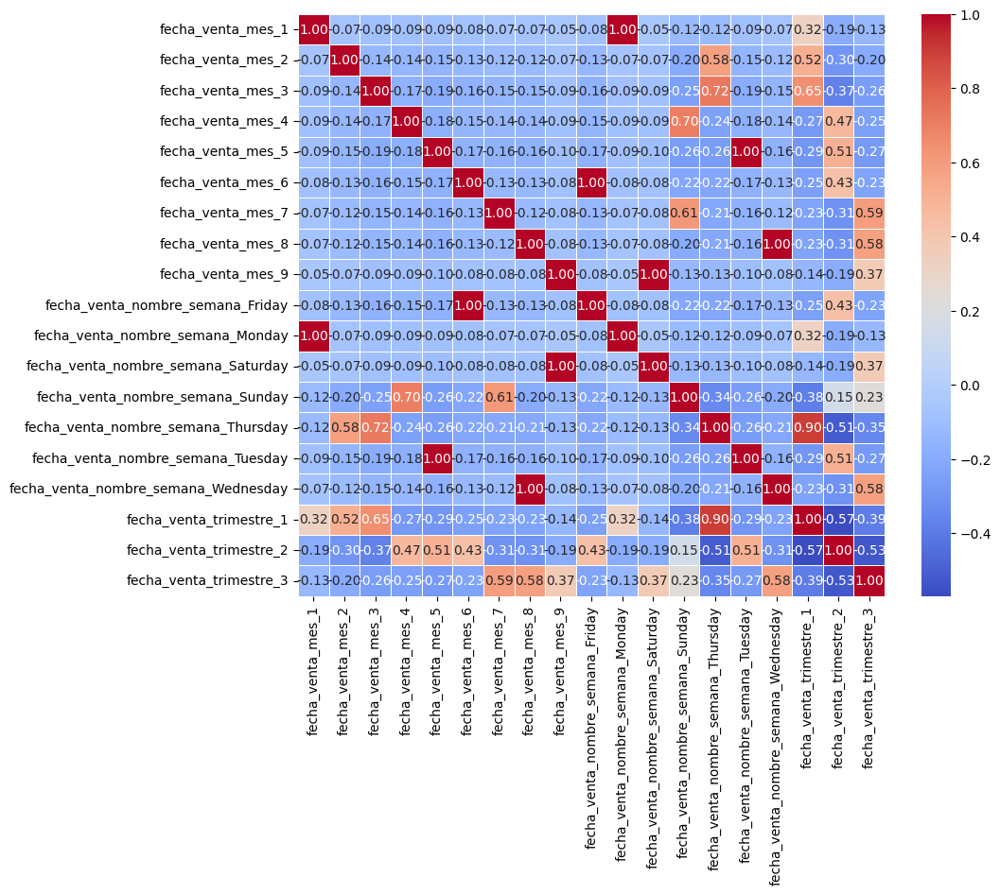

In [130]:
# Identificar y convertir columnas booleanas en el DataFrame filtrado
df_int = identify_convert_boolean_columns(df_int) # f7

# Visualizar la matriz de correlación de las columnas filtradas
corr = visualizar_correlacion(df_int, df_int.columns) # f13

Se ha observado una fuerte correlación entre las variables de mes y día de la semana, ya que solo hay datos de día 1 de mes. Por lo tanto, procedemos a eliminar todas las columnas relacionadas con el día de la semana, manteniendo solo las correspondientes al mes. 
Asimismo, eliminamos la columna fecha_venta_trimestre por tener solo 3 valores únicos y estar relacionada con fecha_venta_mes.

In [131]:
# Eliminar columnas usando el método drop
columnas_a_eliminar = df_bmw_3.filter(like='semana').columns
df_bmw_3 = df_bmw_3.drop(columns=columnas_a_eliminar)

# Eliminar columna usando el método del
del(df_bmw_3["fecha_venta_trimestre"])

In [132]:
# Obtener un resumen del DataFrame df_bmw_3
df_bmw_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4838 entries, 0 to 4837
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   modelo                       4835 non-null   object 
 1   km                           4836 non-null   float64
 2   potencia                     4837 non-null   float64
 3   tipo_gasolina                4833 non-null   object 
 4   color                        4393 non-null   object 
 5   tipo_coche                   3380 non-null   object 
 6   volante_regulable            4834 non-null   object 
 7   aire_acondicionado           4353 non-null   object 
 8   camara_trasera               4836 non-null   object 
 9   asientos_traseros_plegables  1452 non-null   object 
 10  elevalunas_electrico         4836 non-null   object 
 11  bluetooth                    4110 non-null   object 
 12  gps                          4838 non-null   bool   
 13  alerta_lim_velocid

#### Resumen de conclusiones

- Eliminamos la columna fecha_venta_dia porque solo contiene valores del primer día del mes.
- Eliminamos las filas correspondientes a los años 2007-2010, ya que solo había 1 valor por año que no aportaba nada al análisis.
- Eliminamos la columna fecha_venta_año ya que solo quedaba un valor correspondiente al año 2018.
- Eliminamos la columna fecha_venta_nombre_semana debido a que, al contener datos solo para el primer día del mes, está altamente correlacionada con fecha_venta_mes.
- Eliminamos la columna fecha_venta_trimestre porque está correlacionada con fecha_venta_mes y solo contiene 3 valores únicos.


## Comprobación de filas duplicadas: no se encontraron filas duplicadas

In [133]:
# Contar el número de filas duplicadas en el DataFrame df_bmw_3
num_duplicados = df_bmw_3.duplicated().sum()

No hay filas duplicadas.

## Tratamiento de valores nulos

### Porcentaje de valores faltantes por columna

In [134]:
# Calcular el porcentaje de valores faltantes por columna, redondeado a dos decimales
(df_bmw_3.isnull().mean() * 100).round(2)

modelo                          0.06
km                              0.04
potencia                        0.02
tipo_gasolina                   0.10
color                           9.20
tipo_coche                     30.14
volante_regulable               0.08
aire_acondicionado             10.02
camara_trasera                  0.04
asientos_traseros_plegables    69.99
elevalunas_electrico            0.04
bluetooth                      15.05
gps                             0.00
alerta_lim_velocidad           15.01
precio                          0.12
fecha_registro_existe           0.00
fecha_venta_mes                 0.00
dtype: float64

In [135]:
df_bmw_3.isnull().sum()

modelo                            3
km                                2
potencia                          1
tipo_gasolina                     5
color                           445
tipo_coche                     1458
volante_regulable                 4
aire_acondicionado              485
camara_trasera                    2
asientos_traseros_plegables    3386
elevalunas_electrico              2
bluetooth                       728
gps                               0
alerta_lim_velocidad            726
precio                            6
fecha_registro_existe             0
fecha_venta_mes                   0
dtype: int64

### Analizamos columnas en las que los valores NaN constituyen menos del 1% del total de valores en la columna

In [136]:
# Llamar a la función para obtener y imprimir columnas con menos de 10 valores faltantes y el total de valores faltantes
columns_with_few_nans, total_nans = imprimir_cols_few_nan(df_bmw_3, umbral=10)  # f2


8 columns with few NaN: ['modelo', 'km', 'potencia', 'tipo_gasolina', 'volante_regulable', 'camara_trasera', 'elevalunas_electrico', 'precio']

Column: modelo, Number of rows with NaN: 3
modelo       km  potencia tipo_gasolina  color tipo_coche volante_regulable aire_acondicionado camara_trasera asientos_traseros_plegables elevalunas_electrico bluetooth   gps alerta_lim_velocidad  precio  fecha_registro_existe  fecha_venta_mes
   NaN 146338.0     105.0        diesel  black        NaN             False               True          False                         NaN                False       NaN  True                  NaN 13300.0                  False                8
   NaN 115566.0     105.0        diesel silver        suv             False               True          False                         NaN                 True     False  True                False 14900.0                   True                9
   NaN 118640.0     110.0        diesel  white        NaN             False     

#### Evaluamos la posibilidad de rellenar los datos basandose en modelo; sin embargo, no es viable

In [137]:
# Contar la frecuencia de cada valor en 'potencia' para las filas donde el modelo es '525'
df_bmw_3[df_bmw_3["modelo"]=="525"]["potencia"].value_counts(dropna=False)

potencia
160.0    85
155.0    34
150.0    33
120.0    12
130.0     5
145.0     5
85.0      4
141.0     2
105.0     2
NaN       1
Name: count, dtype: int64

A un tipo de modelo le pueden corresponder diferentes potencias

In [138]:
# Contar la frecuencia de cada valor en 'tipo_gasolina' para las filas donde el modelo es '318'
df_bmw_3[df_bmw_3["modelo"] == "318"]["tipo_gasolina"].value_counts(dropna=False)

tipo_gasolina
diesel    553
petrol     11
NaN         3
Diesel      1
Name: count, dtype: int64

A un tipo de modelo le pueden corresponder diferentes tipos de gasolina

In [139]:
# Contar la frecuencia de cada valor en 'volante_regulable' para las filas donde el modelo es '520'
df_bmw_3[df_bmw_3["modelo"] == "520"]["volante_regulable"].value_counts(dropna=False)

volante_regulable
True     489
False    144
Name: count, dtype: int64

A un tipo de modelo le pueden corresponder varios tipos de volante regulable

In [140]:
# Contar la frecuencia de cada valor en 'camara_trasera' para las filas donde el modelo es '520'
df_bmw_3[df_bmw_3["modelo"] == "520"]["camara_trasera"].value_counts(dropna=False)

camara_trasera
False    501
True     131
NaN        1
Name: count, dtype: int64

A un tipo de modelo le pueden corresponder varios tipos de camara trasera

In [141]:
# Contar la frecuencia de cada valor en 'elevalunas_electrico' para las filas donde el modelo es '640'
df_bmw_3[df_bmw_3["modelo"] == "640"]["elevalunas_electrico"].value_counts(dropna=False)

elevalunas_electrico
True     6
NaN      1
False    1
Name: count, dtype: int64

A un tipo de modelo le pueden corresponder varios tipos de elevalunas electrico

#### Eliminamos las filas de las columnas que tienen menos del 1% de datos no nulos.

In [142]:
columns_with_few_nans

['modelo',
 'km',
 'potencia',
 'tipo_gasolina',
 'volante_regulable',
 'camara_trasera',
 'elevalunas_electrico',
 'precio']

Eliminamos las filas con valores NaN en estas columnas porque representan menos del 1% de los datos, y no es posible encontrar valores adecuados para rellenarlos. 

In [143]:
# Crear una copia profunda del DataFrame df_bmw_3
df_bmw_4 = df_bmw_3.copy(deep=True)

In [144]:
# Eliminar las filas que contienen valores nulos
df_bmw_4.dropna(subset=columns_with_few_nans,inplace=True) 

In [145]:
# Restablecer el índice 
df_bmw_4.reset_index(drop=True,inplace=True) 


### Analizamos columnas en las que los valores NaN constituyen mas del 9% del total de valores en la columna

La columna asientos_traseros_plegables tiene aproximadamente un 70% de valores nulos y no es una característica clave para el modelo. Para evitar distorsionar los datos, hemos decidido eliminarla de la consideración.

In [146]:
# Eliminamos la columna 'asientos_traseros_plegables'
del(df_bmw_4["asientos_traseros_plegables"])

In [147]:
# Identificar columnas con valores faltantes en df_bmw_4
cols_with_nans = df_bmw_4.columns[df_bmw_4.isnull().sum() > 0].tolist()

In [148]:
 # Columnas para rellenar nulos que podrían estar relacionados con el modelo del coche
cols_with_nans 

['color',
 'tipo_coche',
 'aire_acondicionado',
 'bluetooth',
 'alerta_lim_velocidad']

In [149]:
# Imprimir los valores únicos y sus conteos para las columnas con valores faltantes, ordenados por el conteo en lugar de por los valores.
print_unique_value_counts(df_bmw_4[cols_with_nans], False) # f1

Valores únicos:

color: 11 valores únicos
['black' 'grey' 'white' 'red' 'silver' 'blue' nan 'orange' 'beige' 'brown'
 'green']

tipo_coche: 9 valores únicos
[nan 'convertible' 'coupe' 'estate' 'hatchback' 'sedan' 'subcompact' 'suv'
 'van']

aire_acondicionado: 3 valores únicos
[True False nan]

bluetooth: 3 valores únicos
[nan True False]

alerta_lim_velocidad: 3 valores únicos
[nan True False]

Conteos de valores:

Columna: color
     Value  Count
0    black   1486
1     grey   1067
2     blue    642
3    white    480
4      NaN    442
5    brown    302
6   silver    290
7      red     47
8    beige     37
9    green     14
10  orange      6

Columna: tipo_coche
         Value  Count
0          NaN   1448
1       estate   1095
2        sedan    821
3          suv    754
4    hatchback    488
5   subcompact     77
6        coupe     73
7  convertible     29
8          van     28

Columna: aire_acondicionado
   Value  Count
0   True   3446
1  False    886
2    NaN    481

Columna: bluet

Se puede hipotetizar que los parámetros considerados están relacionados con el modelo. Rellenamos los valores nulos utilizando el valor más frecuente dentro de cada grupo específico. En caso de que no haya un valor más frecuente en el grupo, se usa el valor más frecuente global de la columna.

In [150]:
# Crear una copia profunda del DataFrame df_bmw_4
df_bmw_5 = df_bmw_4.copy(deep=True)

In [151]:
# Configura Pandas para no realizar downcasting silencioso en futuras versiones,
# lo que ayuda a evitar cambios inesperados en el tipo de datos al ejecutar la función fill_na_with_mode
pd.set_option('future.no_silent_downcasting', True)

In [152]:
# Para cada columna con valores nulos en cols_with_nans,
# utilizar la función fill_na_with_group_mode para rellenar los valores nulos con el valor más frecuente del grupo 'modelo'
for col in cols_with_nans: 
    df_bmw_5 = fill_na_with_group_mode(df_bmw_5, "modelo", col)  # Llamada a la función f3

In [153]:
# Contar el número de valores nulos en cada columna del DataFrame df_bmw_5
df_bmw_5.isnull().sum()

modelo                   0
km                       0
potencia                 0
tipo_gasolina            0
color                    0
tipo_coche               0
volante_regulable        0
aire_acondicionado       0
camara_trasera           0
elevalunas_electrico     0
bluetooth                0
gps                      0
alerta_lim_velocidad     0
precio                   0
fecha_registro_existe    0
fecha_venta_mes          0
dtype: int64

### Comparamos las distribuciones de los datos antes y después de imputar los valores nulos

In [154]:
# Obtener listas de columnas clasificadas como numéricas, categóricas y booleanas en el DataFrame df_bmw_5,
# excluyendo la columna 'fecha_registro_existe' de la clasificación
# La función devuelve tres listas: lista_numericas, lista_categoricas y lista_boolean
lista_numericas, lista_categoricas, lista_boolean = obtener_lista_variables(df_bmw_5, "fecha_registro_existe")  # f4

Lista numéricas: ['fecha_venta_mes', 'km', 'potencia', 'precio']
Lista categóricas: ['aire_acondicionado', 'alerta_lim_velocidad', 'bluetooth', 'camara_trasera', 'color', 'elevalunas_electrico', 'modelo', 'tipo_coche', 'tipo_gasolina', 'volante_regulable']
Lista booleanas: ['gps']


In [155]:
# Excluye las dos primeras columnas de la lista de columnas numéricas
# Esto puede ser necesario si se desea omitir columnas específicas que no deben ser consideradas en el análisis numérico.
lista_numericas = lista_numericas[2:]

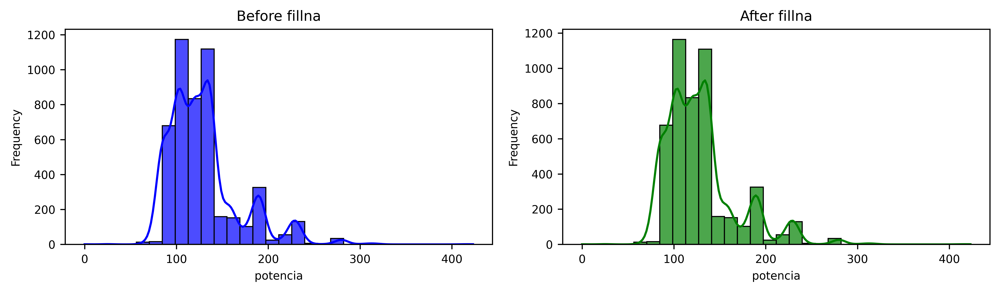

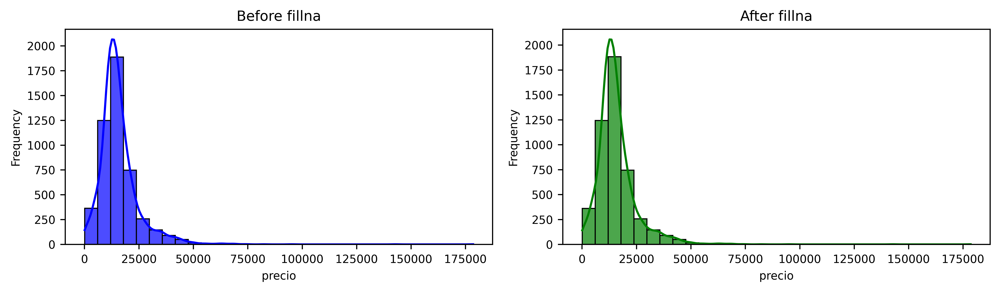

In [156]:
# Itera sobre cada columna en la lista de columnas numéricas
# Para cada columna, genera un histograma comparativo de los datos antes y después de la transformación,
# usando seaborn para la visualización, con 30 bins y con la opción de incluir la estimación de densidad kernel (KDE)
for col in lista_numericas:
    plot_before_after_sns(df_bmw_3, df_bmw_5, col, use_seaborn=True, bin_size=30, kde_on=True, plot_type='hist')  # f5

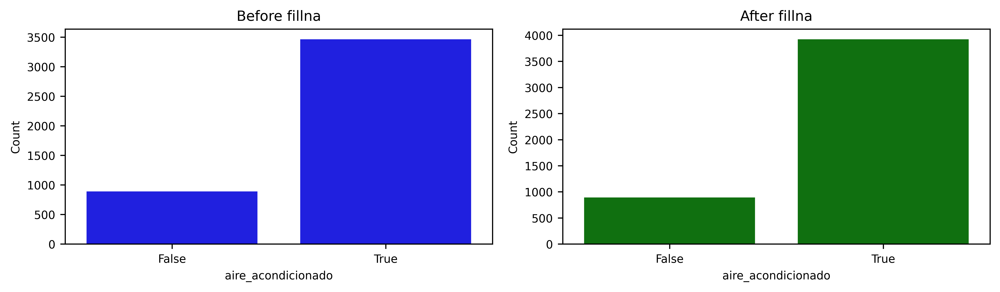

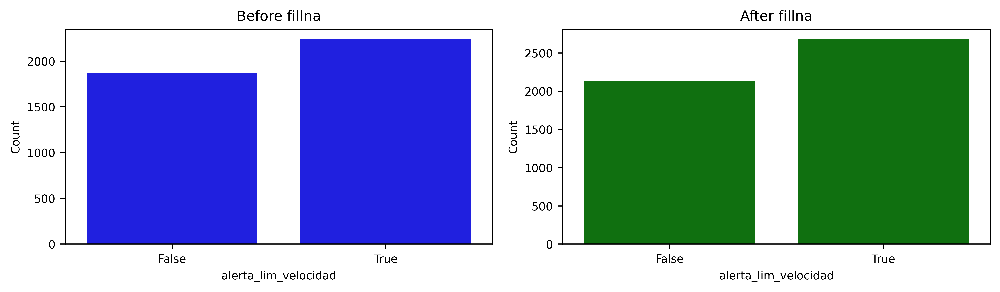

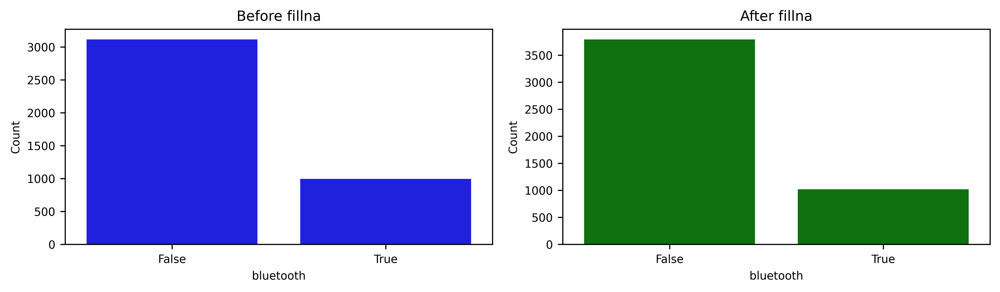

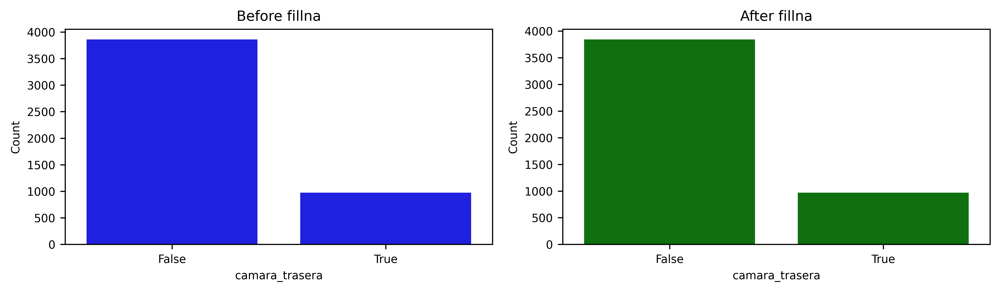

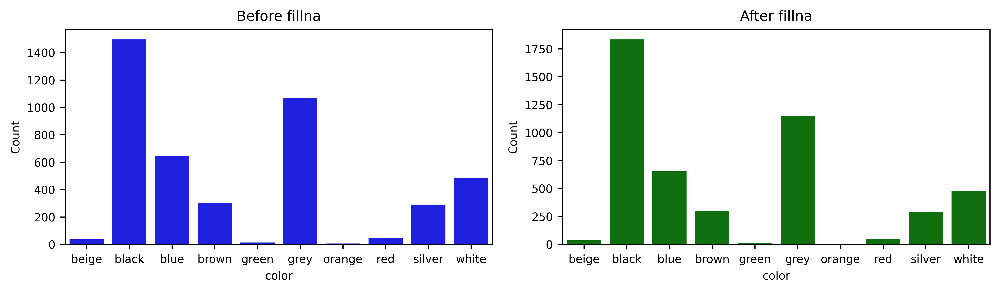

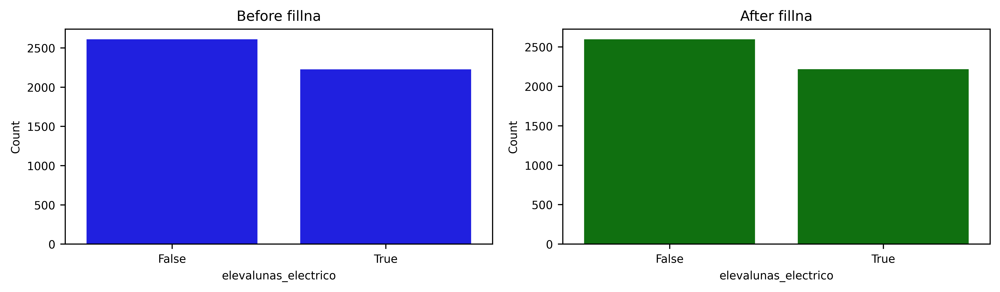

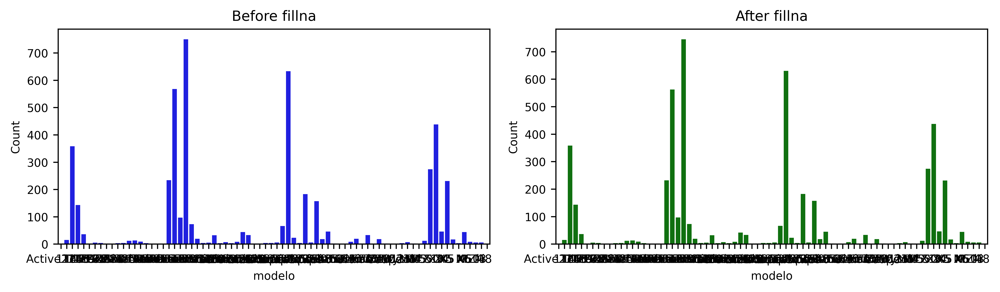

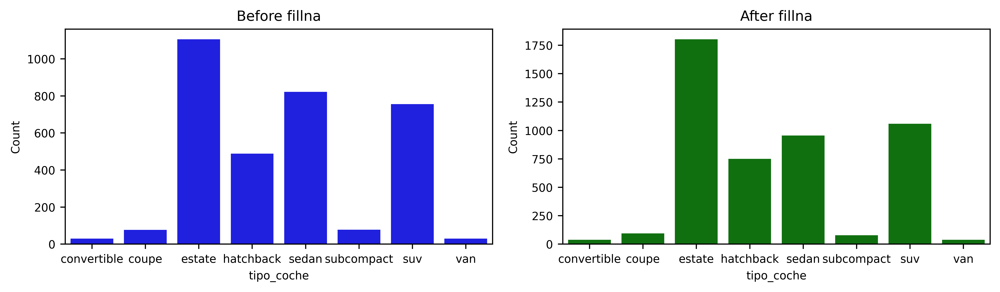

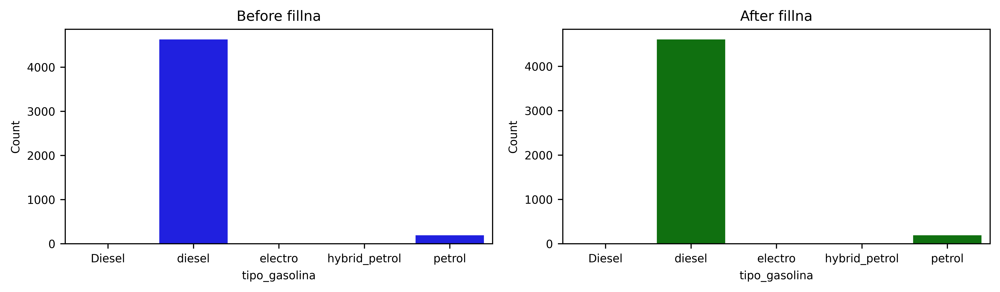

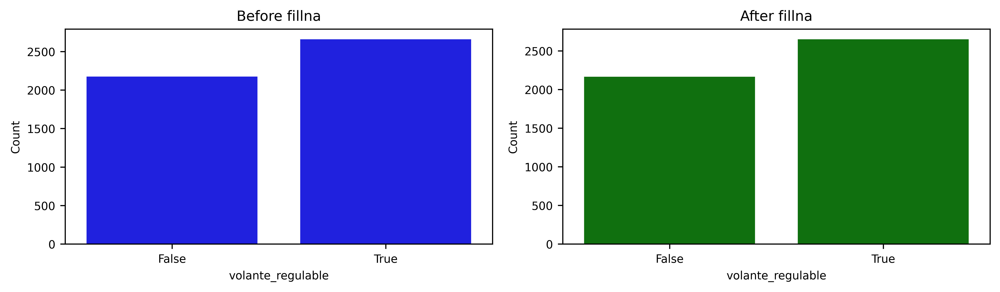

In [157]:
# Itera sobre cada columna en la lista de columnas categóricas
# Para cada columna, genera un gráfico de barras comparativo de los datos antes y después de la transformación,
# usando seaborn para la visualización, sin incluir la estimación de densidad kernel (KDE)
for col in lista_categoricas:
    plot_before_after_sns(df_bmw_3, df_bmw_5, col, use_seaborn=True, bin_size=30, kde_on=False, plot_type='bar')  # f5

El valor que ha alterado significativamente la distribución es el tipo de coche, por lo que estamos considerando una estrategia alternativa.

In [158]:
# Crear una copia profunda del DataFrame df_bmw_5
df_bmw_6 = df_bmw_5.copy(deep=True)

In [159]:
# Eliminar columna de DataFrame
del(df_bmw_6["tipo_coche"])

In [160]:
# Asignar los valores de la columna 'tipo_coche' del DataFrame df_bmw_3
# a una nueva columna llamada 'tipo_coche_random' en el DataFrame df_bmw_6
df_bmw_6['tipo_coche_random'] = df_bmw_3['tipo_coche']
df_bmw_5['tipo_coche_random'] = df_bmw_3['tipo_coche']

In [161]:
# Rellenar los valores faltantes en la columna 'tipo_coche_random' del DataFrame df_bmw_6
# utilizando datos sintéticos generados para completar los valores nulos
df_bmw_6 = fill_na_with_synthetic_data(df_bmw_6, 'tipo_coche_random')  # f6

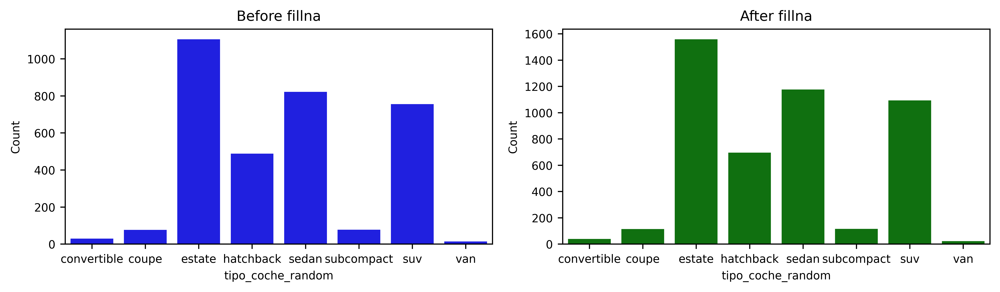

In [162]:
# Comparar la distribución de la columna 'tipo_coche_random' en los DataFrames df_bmw_5 y df_bmw_6
# Utilizamos la función plot_before_after_sns para generar gráficos de barras que muestren la distribución 
# antes y después de rellenar los valores nulos en 'tipo_coche_random' 
plot_before_after_sns(df_bmw_5, df_bmw_6, 'tipo_coche_random', use_seaborn=True, bin_size=30, kde_on=False, plot_type='bar')  # f5

Ahora la distribución es la misma. 

## Análisis univariable

### Identificamos qué columnas categóricas son booleanas y las convertimos a tipo int8

In [163]:
# Crear una copia profunda del DataFrame df_bmw_6 para preservar los datos originales
df_bmw_7 = df_bmw_6.copy(deep=True)  

# Identificar y convertir las columnas booleanas en el DataFrame df_bmw_7
df_bmw_7 = identify_convert_boolean_columns(df_bmw_6)  # f7

# Imprimir información sobre el DataFrame df_bmw_7 para verificar las conversiones realizadas y la estructura actual del DataFrame
df_bmw_7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4813 entries, 0 to 4812
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   modelo                 4813 non-null   object 
 1   km                     4813 non-null   float64
 2   potencia               4813 non-null   float64
 3   tipo_gasolina          4813 non-null   object 
 4   color                  4813 non-null   object 
 5   volante_regulable      4813 non-null   int8   
 6   aire_acondicionado     4813 non-null   int8   
 7   camara_trasera         4813 non-null   int8   
 8   elevalunas_electrico   4813 non-null   int8   
 9   bluetooth              4813 non-null   int8   
 10  gps                    4813 non-null   int8   
 11  alerta_lim_velocidad   4813 non-null   int8   
 12  precio                 4813 non-null   float64
 13  fecha_registro_existe  4813 non-null   int8   
 14  fecha_venta_mes        4813 non-null   int32  
 15  tipo

### Separamos los datos en columnas numéricas, categóricas y booleanas

In [164]:
# Obtener las listas de columnas categóricas, numéricas y booleanas del DataFrame df_bmw_7,
# excluyendo la columna "precio" del análisis 
lista_numericas, lista_categoricas, lista_boolean = obtener_lista_variables(df_bmw_7, [])  # f4

Lista numéricas: ['km', 'potencia', 'volante_regulable', 'aire_acondicionado', 'camara_trasera', 'elevalunas_electrico', 'bluetooth', 'gps', 'alerta_lim_velocidad', 'precio', 'fecha_registro_existe', 'fecha_venta_mes']
Lista categóricas: ['modelo', 'tipo_gasolina', 'color', 'tipo_coche_random']
Lista booleanas: []


### Analizamos columnas numericas

#### Análisis descriptivo

Estadísticas descriptivas:
               km  potencia     precio  fecha_venta_mes  volante_regulable  \
count     4813.00   4813.00    4813.00          4813.00            4813.00   
mean    140872.17    128.98   15845.79             4.93               0.55   
std      60188.38     39.01    9225.47             2.16               0.50   
min        -64.00      0.00     100.00             1.00               0.00   
25%     102735.00    100.00   10900.00             3.00               0.00   
50%     140829.00    120.00   14200.00             5.00               1.00   
75%     175174.00    135.00   18600.00             7.00               1.00   
max    1000376.00    423.00  178500.00             9.00               1.00   

       aire_acondicionado  camara_trasera  elevalunas_electrico  bluetooth  \
count             4813.00          4813.0               4813.00    4813.00   
mean                 0.81             0.2                  0.46       0.21   
std                  0.39           

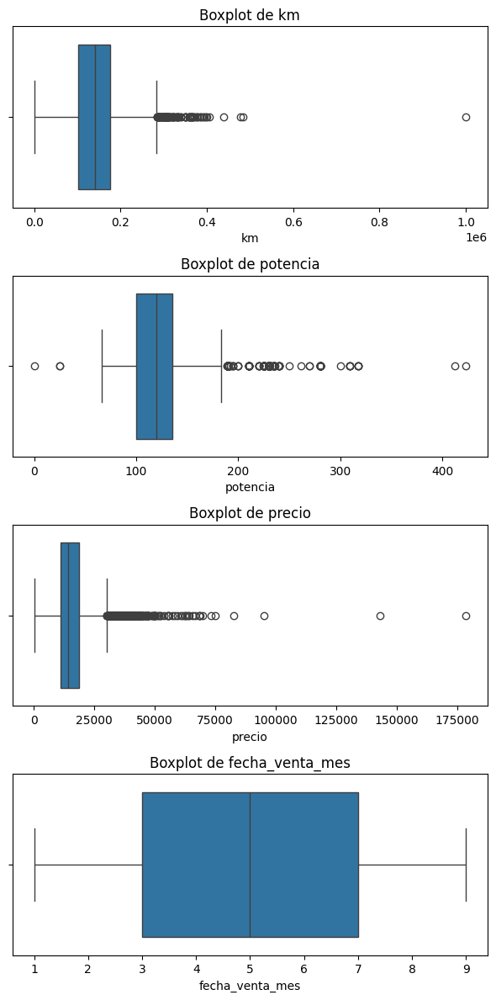

Histogramas para columnas numéricas con más de 2 valores:


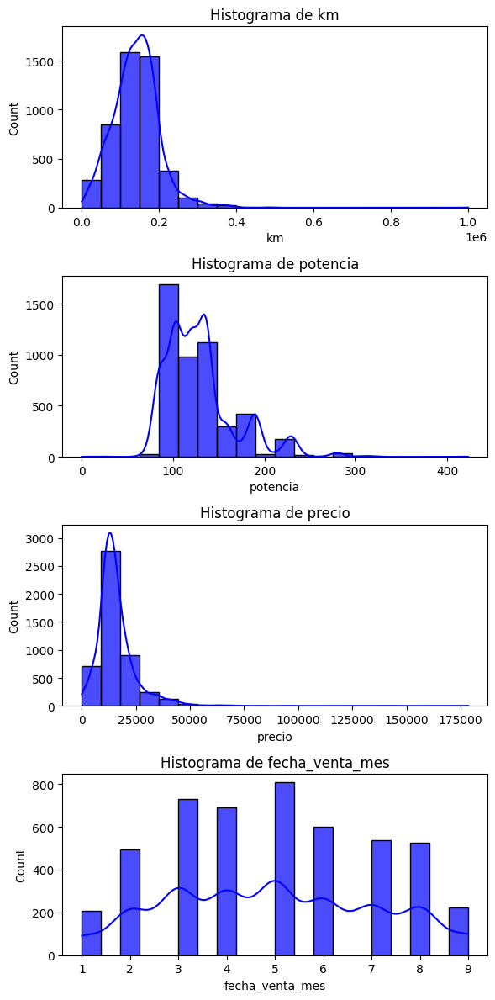

Barplots para columnas numéricas con exactamente 2 valores únicos:


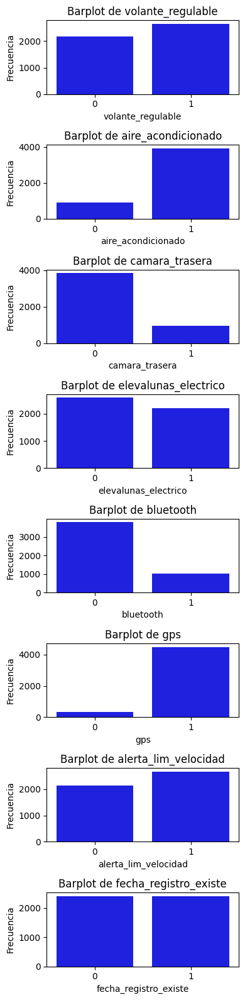

Matriz de correlación:
                         km  potencia  precio  fecha_venta_mes  \
km                     1.00     -0.05   -0.41             0.00   
potencia              -0.05      1.00    0.64            -0.03   
precio                -0.41      0.64    1.00             0.01   
fecha_venta_mes        0.00     -0.03    0.01             1.00   
volante_regulable      0.07      0.33    0.27             0.08   
aire_acondicionado     0.01      0.18    0.23             0.01   
camara_trasera         0.00      0.31    0.25             0.02   
elevalunas_electrico   0.05      0.34    0.26            -0.02   
bluetooth             -0.03      0.23    0.20            -0.01   
gps                    0.16      0.01   -0.01             0.06   
alerta_lim_velocidad  -0.02      0.51    0.43            -0.04   
fecha_registro_existe -0.00      0.01    0.02            -0.00   

                       volante_regulable  aire_acondicionado  camara_trasera  \
km                                  0.

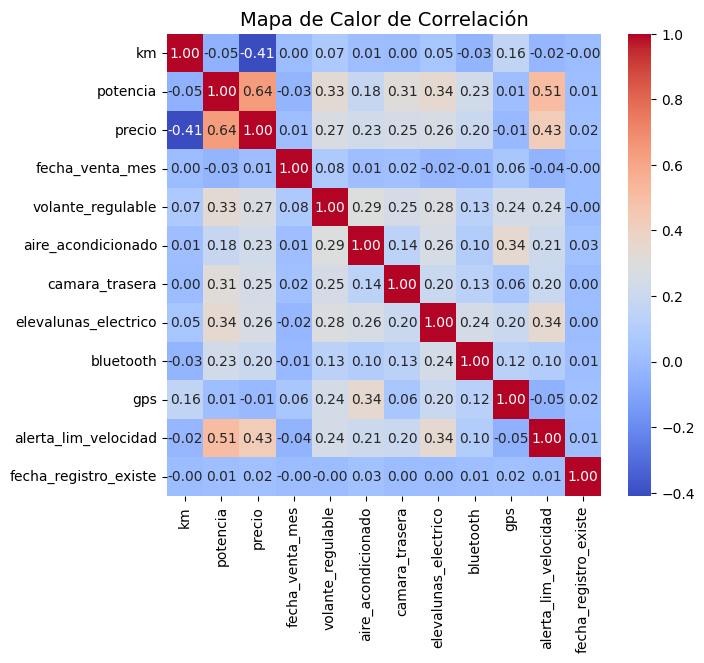

In [165]:
# Analizar las columnas numéricas y binarias del DataFrame df_bmw_7 utilizando la función analizar_columnas_numericas
analizar_columnas_numericas(df_bmw_7, lista_numericas, include_binarios=True, bin_size=20, kde_on=True)  # f8

#### Resumen de ánalisis estadístico descriptivo antes de procesar valores atípicos

Se ha observado que la columna km contiene un valor negativo, que hay valores nulos y extremadamente bajos en la columna potencia, y que la columna precio presenta tanto valores muy bajos como extremadamente altos.

#### Analizamos km,potencia,precio

##### Columna km

In [166]:
# Crear una copia profunda del DataFrame df_bmw_7 y almacenarla en df_bmw_8 para preservar el estado original del DataFrame 
df_bmw_8 = df_bmw_7.copy(deep=True)

In [167]:
# Filtrar el DataFrame df_bmw_8 para mostrar las filas donde la columna 'km' tiene valores menores que 0
df_bmw_8[df_bmw_8["km"] < 0]

,modelo,km,potencia,tipo_gasolina,color,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,fecha_venta_mes,tipo_coche_random
2911,640 Gran Coupé,-64.0,230.0,diesel,black,1,1,0,0,0,1,1,75000.0,0,4,sedan


In [168]:
# Filtrar el DataFrame df_bmw_8 para mostrar las columnas 'km', 'potencia' y 'precio' específicamente para el modelo "640 Gran Coupé".
df_bmw_8[df_bmw_8["modelo"] == "640 Gran Coupé"][["km", "potencia", "precio"]]

,km,potencia,precio
65,67403.0,230.0,55200.0
110,63421.0,230.0,45800.0
2280,70490.0,230.0,35700.0
2289,133621.0,230.0,40000.0
2297,84187.0,230.0,30000.0
2299,70840.0,230.0,36500.0
2376,166168.0,230.0,32100.0
2388,60894.0,230.0,39300.0
2395,182837.0,230.0,33100.0
2418,187900.0,230.0,32800.0


El vehículo parece ser nuevo, por lo que actualizaremos el valor de los kilómetros a 0

In [169]:
# Corregir los valores negativos en la columna 'km' del DataFrame df_bmw_8, estableciendo todos los valores menores que 0 a 0.
df_bmw_8.loc[df_bmw_8["km"] < 0, "km"] = 0

##### Columna potencia

Hemos identificado valores de potencia inferiores a 80 hp en el conjunto de datos. Dado que no existen modelos de BMW, incluso en sus versiones más antiguas, con menos de 80 caballos de potencia, es probable que estos datos sean incorrectos, hayan sido ingresados erróneamente, o correspondan a otra métrica (como kilovatios, kW) no correctamente convertida.

Por lo tanto, imputaremos estos valores con el valor más frecuente de potencia dentro del mismo modelo, para mantener la coherencia y precisión en el análisis. En el caso del modelo 114, este valor es 102 hp, y para los demás modelos, utilizaremos el valor más frecuente en la columna.

In [170]:
# Obtener los índices de las filas en df_bmw_8 donde los valores de la columna 'potencia' son menores que 60
rows_lt_umbral = df_bmw_8[df_bmw_8["potencia"] < 80].index

In [171]:
# Filtrar el DataFrame df_bmw_8 para mostrar las filas donde los valores en la columna 'potencia' son menores a 60
df_bmw_8[df_bmw_8["potencia"] < 80]

,modelo,km,potencia,tipo_gasolina,color,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,fecha_venta_mes,tipo_coche_random
1769,i3,152328.0,25.0,hybrid_petrol,black,0,1,0,0,0,1,1,20300.0,0,4,hatchback
1777,114,179307.0,70.0,diesel,blue,0,1,0,0,0,1,0,8300.0,0,7,hatchback
1820,114,100398.0,70.0,diesel,white,0,1,0,0,1,1,0,10700.0,0,2,hatchback
1868,i3,26542.0,75.0,electro,grey,0,1,0,0,0,1,1,20900.0,1,2,hatchback
1898,i3,152470.0,25.0,hybrid_petrol,black,0,1,0,0,0,1,1,15500.0,0,3,hatchback
1956,114,57344.0,70.0,diesel,grey,0,1,0,0,0,1,0,11800.0,0,3,hatchback
1961,114,150373.0,70.0,diesel,brown,0,1,0,0,0,1,0,8200.0,1,3,sedan
1974,114,72527.0,70.0,diesel,silver,0,0,0,0,0,1,0,9300.0,1,3,hatchback
2141,114,15546.0,75.0,petrol,black,0,0,0,0,0,1,0,10800.0,1,5,hatchback
2169,114,52299.0,75.0,petrol,black,0,0,0,1,1,1,0,13400.0,1,9,hatchback


Rellenamos los valores atípicos con el valor más frecuente para el modelo correspondiente

In [172]:
# Crear una copia profunda del DataFrame df_bmw_8 y asignarla a df_bmw_9
df_bmw_9 = df_bmw_8.copy(deep=True)

In [173]:
# Rellenar los valores en la columna 'potencia' que son menores a 60 con el valor más frecuente del grupo 'modelo'
df_bmw_9 = fill_values_below_threshold(df_bmw_9, "modelo", "potencia", 80, method='mode') # f9

In [174]:
# Asegurar que los valores del modelo 114 sean 102
df_bmw_9.loc[df_bmw_9["modelo"] == '114', "potencia"] = 102

In [175]:
# Mostrar las filas de DataFrame df_bmw_9 donde los valores en la columna 'potencia' eran menores al umbral de 80
# Utilizamos los índices almacenados en rows_lt_umbral para filtrar y visualizar estas filas específicas
df_bmw_9.iloc[rows_lt_umbral]

,modelo,km,potencia,tipo_gasolina,color,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,fecha_venta_mes,tipo_coche_random
1769,i3,152328.0,125.0,hybrid_petrol,black,0,1,0,0,0,1,1,20300.0,0,4,hatchback
1777,114,179307.0,102.0,diesel,blue,0,1,0,0,0,1,0,8300.0,0,7,hatchback
1820,114,100398.0,102.0,diesel,white,0,1,0,0,1,1,0,10700.0,0,2,hatchback
1868,i3,26542.0,125.0,electro,grey,0,1,0,0,0,1,1,20900.0,1,2,hatchback
1898,i3,152470.0,125.0,hybrid_petrol,black,0,1,0,0,0,1,1,15500.0,0,3,hatchback
1956,114,57344.0,102.0,diesel,grey,0,1,0,0,0,1,0,11800.0,0,3,hatchback
1961,114,150373.0,102.0,diesel,brown,0,1,0,0,0,1,0,8200.0,1,3,sedan
1974,114,72527.0,102.0,diesel,silver,0,0,0,0,0,1,0,9300.0,1,3,hatchback
2141,114,15546.0,102.0,petrol,black,0,0,0,0,0,1,0,10800.0,1,5,hatchback
2169,114,52299.0,102.0,petrol,black,0,0,0,1,1,1,0,13400.0,1,9,hatchback


##### Columna precio

In [176]:
# Mostrar un resumen estadístico de la columna 'precio' en el DataFrame df_bmw_9
# La transposición (T) permite visualizar la descripción de manera vertical, facilitando la lectura de las estadísticas
df_bmw_9["precio"].describe().T

count      4813.000000
mean      15845.792645
std        9225.467877
min         100.000000
25%       10900.000000
50%       14200.000000
75%       18600.000000
max      178500.000000
Name: precio, dtype: float64

In [177]:
# Imprimir los valores únicos y sus conteos para la columna 'precio' en el DataFrame df_bmw_8
# Los conteos se ordenan por los valores si sort_by_value es True
print_unique_value_counts(df_bmw_8[["precio"]], sort_by_value=True) # f1

Valores únicos:

precio: 437 valores únicos
[1.130e+04 6.970e+04 1.020e+04 2.510e+04 3.340e+04 1.710e+04 1.240e+04
 6.100e+03 6.200e+03 1.730e+04 1.930e+04 1.330e+04 2.170e+04 3.630e+04
 1.050e+04 8.300e+03 2.190e+04 9.200e+03 1.100e+04 7.700e+03 1.680e+04
 3.100e+04 2.630e+04 2.330e+04 2.080e+04 1.800e+03 3.010e+04 2.870e+04
 6.500e+03 1.110e+04 9.900e+03 9.500e+03 2.750e+04 5.500e+03 6.300e+03
 2.400e+03 6.800e+03 2.420e+04 1.180e+04 3.430e+04 1.210e+04 8.000e+03
 9.000e+03 2.430e+04 2.600e+03 2.140e+04 2.620e+04 8.400e+03 7.500e+03
 2.380e+04 2.650e+04 2.770e+04 1.830e+04 2.300e+03 3.020e+04 1.000e+03
 1.900e+04 3.050e+04 2.860e+04 3.890e+04 3.210e+04 4.700e+04 5.520e+04
 1.610e+04 1.950e+04 5.360e+04 2.800e+04 2.240e+04 3.200e+04 2.640e+04
 8.600e+03 3.150e+04 3.990e+04 8.900e+03 1.690e+04 3.000e+04 8.200e+03
 3.690e+04 2.340e+04 2.300e+04 9.520e+04 2.320e+04 2.530e+04 2.700e+04
 2.250e+04 3.100e+03 1.460e+04 2.610e+04 8.700e+03 2.350e+04 2.680e+04
 2.200e+04 2.180e+04 3.650e+04 1.

<Axes: xlabel='precio', ylabel='Count'>

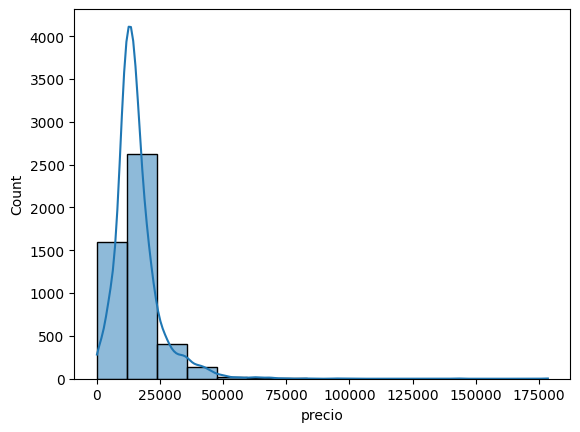

In [178]:
# Crear un histograma de la columna 'precio' en el DataFrame df_bmw_9 con 15 bins
# Añadir una estimación de densidad de Kernel (KDE) para visualizar la distribución de los datos
sns.histplot(df_bmw_9["precio"], bins=15, kde=True)

In [179]:
# Filtrar el DataFrame df_bmw_9 para obtener las filas donde el valor en la columna 'precio' es menor a 500
# Luego, ordenar las filas filtradas por la columna 'precio' en orden ascendente
df_bmw_8[df_bmw_9["precio"] < 500].sort_values(by="precio")

,modelo,km,potencia,tipo_gasolina,color,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,fecha_venta_mes,tipo_coche_random
543,320,179358.0,120.0,diesel,black,0,1,0,0,0,1,1,100.0,1,3,estate
852,318,134156.0,105.0,diesel,grey,0,1,0,0,0,0,1,100.0,1,4,estate
1228,320,170381.0,135.0,diesel,silver,1,1,0,0,0,1,0,100.0,0,5,suv
1805,116,174524.0,85.0,diesel,blue,0,1,0,0,0,1,0,100.0,1,3,hatchback
2802,525,439060.0,105.0,diesel,silver,0,0,1,0,0,1,0,100.0,0,3,sedan
4329,X3,79685.0,190.0,diesel,black,0,0,0,0,0,0,1,100.0,1,5,suv
2446,525,230578.0,85.0,diesel,black,0,1,0,0,0,1,1,200.0,1,8,hatchback
2547,525,229880.0,85.0,diesel,black,0,1,0,0,0,1,0,200.0,1,8,sedan
2584,525,230264.0,85.0,diesel,black,0,0,0,0,0,1,0,200.0,1,8,sedan
1486,520,358332.0,100.0,diesel,blue,0,0,0,1,0,1,0,400.0,0,7,estate


In [180]:
# Filtrar el DataFrame df_bmw_9 para obtener las filas donde el valor en la columna 'precio' es mayor o igual a 70,000
# Luego, ordenar las filas filtradas por la columna 'precio' en orden ascendente
df_bmw_9[df_bmw_9["precio"] > 75000].sort_values(by="precio")

,modelo,km,potencia,tipo_gasolina,color,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,fecha_venta_mes,tipo_coche_random
4119,X6 M,2970.0,423.0,petrol,red,1,1,1,0,0,1,1,82400.0,1,4,suv
86,i8,12402.0,170.0,hybrid_petrol,grey,1,1,0,0,0,0,1,95200.0,0,4,sedan
4657,X4,103222.0,140.0,diesel,grey,1,1,0,1,0,1,1,142800.0,1,8,suv
4726,X3,72515.0,135.0,diesel,blue,0,0,1,0,0,0,1,178500.0,1,8,suv


Los valores de precio muy bajos y muy altos podrían deberse a situaciones especiales, como la venta rápida de un coche viejo o la venta de un coche a un precio elevado debido a que pertenecía a alguien famoso. Por lo tanto, decidimos mantenerlos.

#### Análisis estadístico descriptivo después de procesar valores atípicos

##### Volvemos a analizar los datos

In [181]:
# Obtener listas de variables categóricas, numéricas y booleanas del DataFrame df_bmw_9
lista_numericas, lista_categoricas, lista_boolean = obtener_lista_variables(df_bmw_9,"precio")

Lista numéricas: ['aire_acondicionado', 'alerta_lim_velocidad', 'bluetooth', 'camara_trasera', 'elevalunas_electrico', 'fecha_registro_existe', 'fecha_venta_mes', 'gps', 'km', 'potencia', 'volante_regulable']
Lista categóricas: ['color', 'modelo', 'tipo_coche_random', 'tipo_gasolina']
Lista booleanas: []


In [182]:
# Añadir la columna 'precio' a la lista de columnas numéricas
lista_numericas.append("precio")

Estadísticas descriptivas:
       fecha_venta_mes          km  potencia     precio  aire_acondicionado  \
count          4813.00     4813.00   4813.00    4813.00             4813.00   
mean              4.93   140872.18    129.20   15845.79                0.81   
std               2.16    60188.35     38.75    9225.47                0.39   
min               1.00        0.00     80.00     100.00                0.00   
25%               3.00   102735.00    100.00   10900.00                1.00   
50%               5.00   140829.00    120.00   14200.00                1.00   
75%               7.00   175174.00    135.00   18600.00                1.00   
max               9.00  1000376.00    423.00  178500.00                1.00   

       alerta_lim_velocidad  bluetooth  camara_trasera  elevalunas_electrico  \
count               4813.00    4813.00          4813.0               4813.00   
mean                   0.56       0.21             0.2                  0.46   
std                  

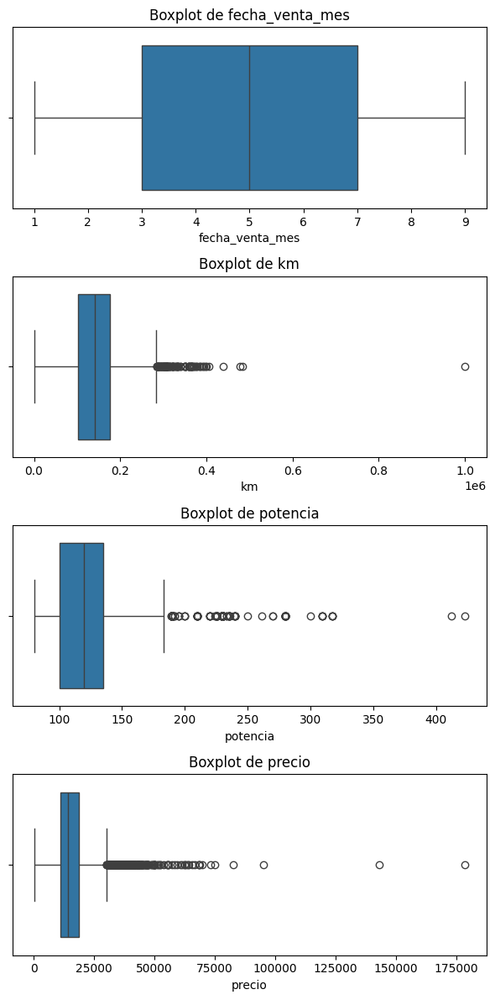

Histogramas para columnas numéricas con más de 2 valores:


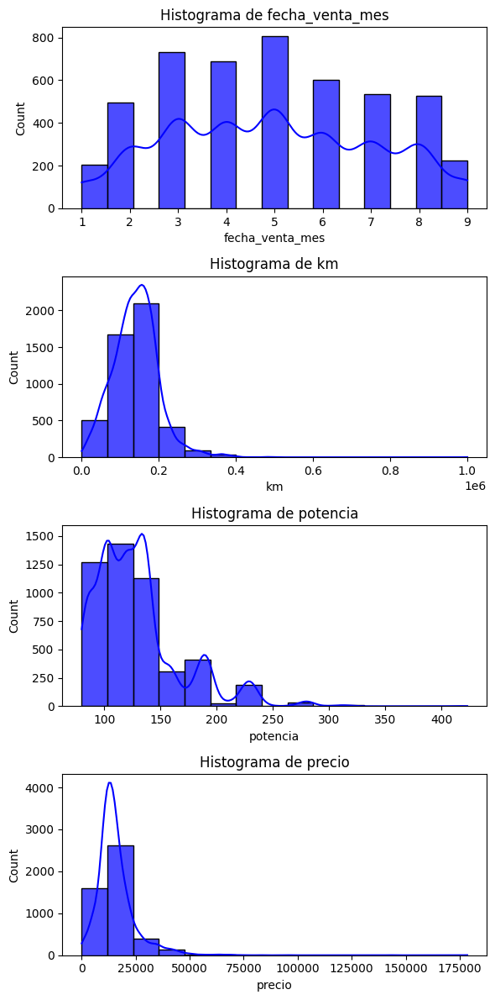

Barplots para columnas numéricas con exactamente 2 valores únicos:


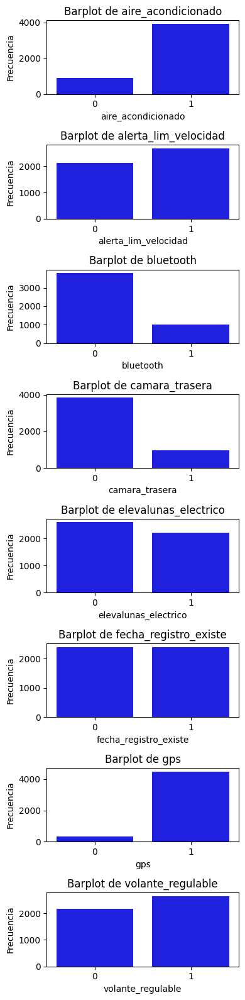

Matriz de correlación:
                       fecha_venta_mes    km  potencia  precio  \
fecha_venta_mes                   1.00  0.00     -0.03    0.01   
km                                0.00  1.00     -0.05   -0.41   
potencia                         -0.03 -0.05      1.00    0.64   
precio                            0.01 -0.41      0.64    1.00   
aire_acondicionado                0.01  0.01      0.18    0.23   
alerta_lim_velocidad             -0.04 -0.02      0.51    0.43   
bluetooth                        -0.01 -0.03      0.23    0.20   
camara_trasera                    0.02  0.00      0.31    0.25   
elevalunas_electrico             -0.02  0.05      0.34    0.26   
fecha_registro_existe            -0.00 -0.00      0.02    0.02   
gps                               0.06  0.16      0.01   -0.01   
volante_regulable                 0.08  0.07      0.33    0.27   

                       aire_acondicionado  alerta_lim_velocidad  bluetooth  \
fecha_venta_mes                      0.0

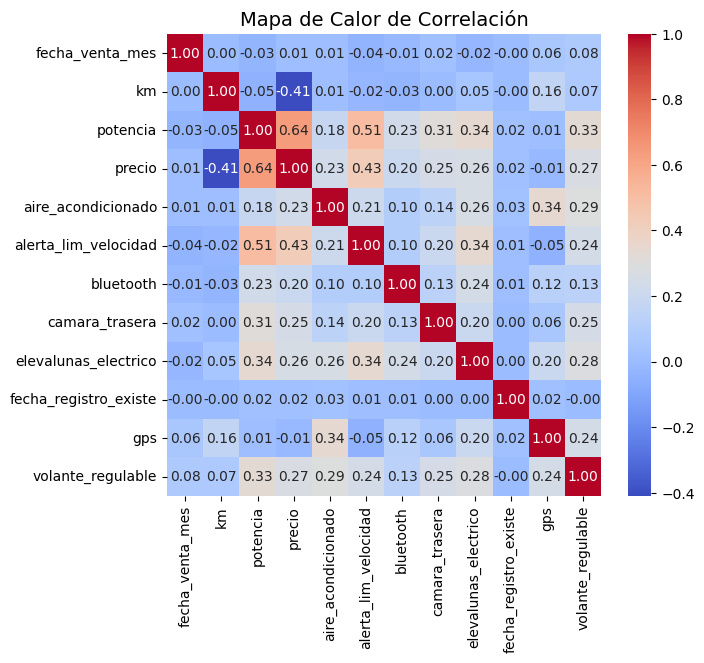

In [183]:
# Analizar columnas numéricas, incluyendo 'precio'
analizar_columnas_numericas(df_bmw_9, lista_numericas, include_binarios=True, bin_size=15, kde_on=True) #f9

##### Resumen de conclusiones

1. **Kilómetros:** la presencia de un valor mínimo negativo sugería errores en los datos que deberían ser corregidos; se cambió a 0 kilómetros ya que el vehículo parece ser nuevo.
2. **Potencia:** Se reemplazaron los valores inferiores a 80 por la moda correspondiente, agrupando por modelo. Si no había suficientes datos para calcular la moda por modelo, se utilizó el valor más frecuente de la columna. Para el modelo 114, se imputó un valor fijo de 102.
3. **Precio:** Existen valores atípicos muy altos (mayores de 75,000), que podrían deberse a características especiales del vehículo, como haber pertenecido a una persona famosa. También hay valores muy bajos (menores de 500), que podrían indicar vehículos con muchos kilómetros o una venta urgente a bajo precio. 
4. **Fecha venta por mes:** Solo hay datos de 9 meses y la mayor parte de las ventas se realizaron en mayo y marzo.
   
**Columnas binarias:**

5. **Aire Acondicionado:** la mayoría (82%) de los vehículos tienen aire acondicionado
6. **Alerta de Límite de Velocidad:** proximadamente el 56% de los vehículos tienen esta característica
7. **Bluetooth:** el 21% de los vehículos están equipados con Bluetooth
8. **Cámara Trasera :** solo el 20% de los vehículos tienen cámara trasera
9. **Elevalunas Eléctrico:** el 46% de los vehículos tienen elevalunas eléctricos
10. **Fecha de Registro Existe:** la mitad de los vehículos tienen fecha de registro disponible
11. **GPS:** la mayoría (93%) de los vehículos cuentan con GPS
12. **Volante Regulable:** Aproximadamente el 55% de los vehículos tienen volante regulable

### Analyzamos variables categoricas

In [184]:
# Tenemos 4 columnas categóricas en el DataFrame df_bmw_9
lista_categoricas

['color', 'modelo', 'tipo_coche_random', 'tipo_gasolina']

Resumen de variables categóricas:

Valores únicos en la columna 'color':
['black' 'grey' 'white' 'red' 'silver' 'blue' 'orange' 'beige' 'brown'
 'green']

Análisis para la columna 'color':
Número de valores únicos: 10
Distribución de valores:
        Conteo  Porcentaje (%)
color                         
black     1834            38.1
grey      1148            23.9
blue       654            13.6
white      481            10.0
brown      302             6.3
silver     290             6.0
red         47             1.0
beige       37             0.8
green       14             0.3
orange       6             0.1


Valores únicos en la columna 'modelo':
['118' 'M4' '320' '420' '425' '335' '325' 'Z4' '120' '220' '650' '135'
 '218' '318' '430' 'M3' '225' 'M235' '316' '435' '640' '640 Gran Coupé'
 '435 Gran Coupé' 'i8' '330' '630' '430 Gran Coupé' '635' '520' '525'
 '530' '535' '320 Gran Turismo' '518' '116' '328' '523' 'X3' 'M550' '528'
 '325 Gran Turismo' '125' '318 Gran Turismo' '420 Gran Co

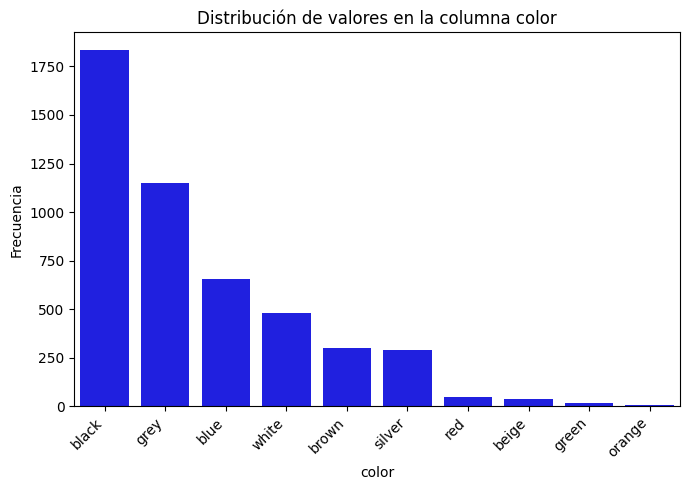

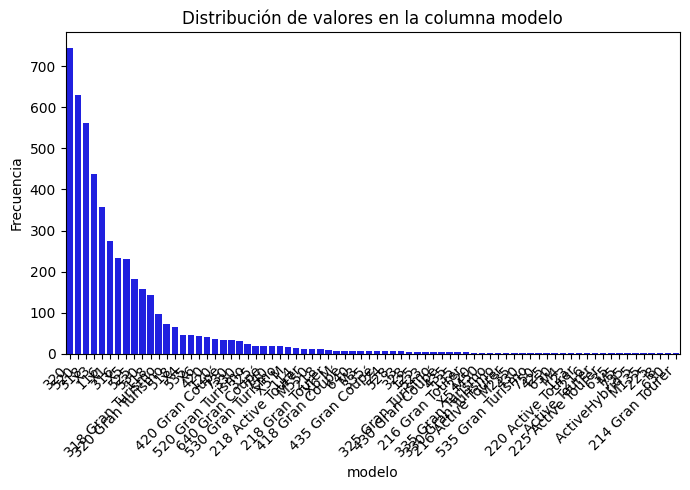

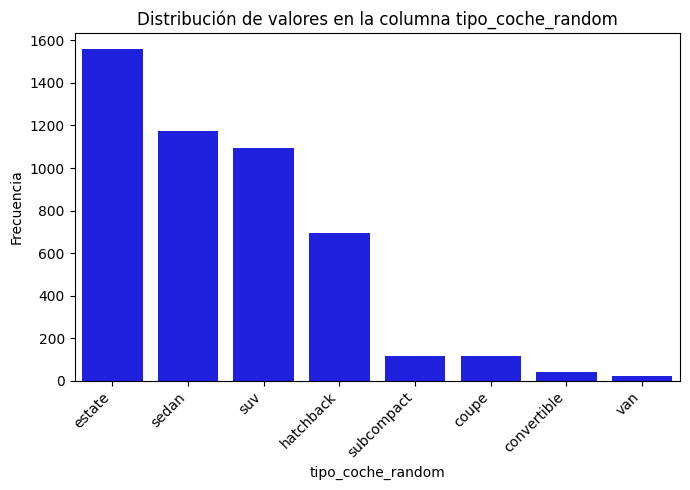

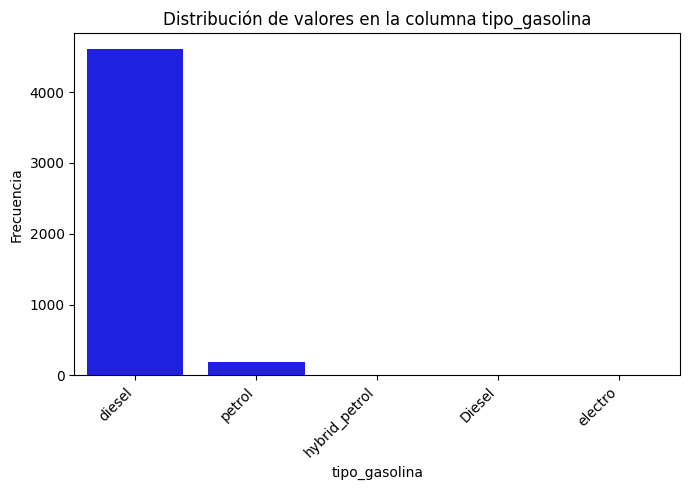

In [185]:
# Analizar las columnas categóricas del DataFrame `df_bmw_9` 
analizar_categoricas(df_bmw_9, lista_categoricas) # f10

#### Resumen analysis datos categoricos

Reducir la cantidad de categorías en las columnas de "modelo", "color", "tipo_gasolina" y tipo_coche_random" transformando en "Otros" todas las categorías con menos del 1% de frecuencia. 

#### Transformar datos categoricos

In [186]:
# Crear una copia profunda del DataFrame original para preservar la integridad de los datos
df_bmw_10 = df_bmw_9.copy(deep=True)

In [187]:
# Aplicar la función categorizar_modelos para clasificar los modelos de vehículos en la columna 'modelo'
df_bmw_10, modelos_desconocidos = categorizar_modelos(df_bmw_10, 'modelo') # f11

In [188]:
# Calcular el conteo y los porcentajes de cada categoría en la columna 'modelo_categoria'
conteo = df_bmw_10["modelo_categoria"].value_counts(dropna=False)
porcentajes = (df_bmw_10["modelo_categoria"].value_counts(dropna=False,normalize=True) * 100)

# Redondear los porcentajes a un decimal y combinar en un DataFrame
pd.DataFrame({
    'Conteo': conteo,
    'Porcentaje (%)': porcentajes.round(2)
}).sort_values(by="Conteo",ascending=False)

,Conteo,Porcentaje (%)
modelo_categoria,,
Serie 3,1782,37.02
Serie 5,1134,23.56
SUV,1057,21.96
Serie 1,563,11.70
Serie 4,101,2.10
Serie 7,54,1.12
Serie 2,50,1.04
Serie 6,36,0.75
M,29,0.60


In [189]:
# Obtener listas de variables categóricas, numéricas y booleanas del DataFrame df_bmw_10
lista_numericas, lista_categoricas, lista_boolean=obtener_lista_variables(df_bmw_10, "")

Lista numéricas: ['aire_acondicionado', 'alerta_lim_velocidad', 'bluetooth', 'camara_trasera', 'elevalunas_electrico', 'fecha_registro_existe', 'fecha_venta_mes', 'gps', 'km', 'potencia', 'precio', 'volante_regulable']
Lista categóricas: ['color', 'modelo_categoria', 'tipo_coche_random', 'tipo_gasolina']
Lista booleanas: []


In [190]:
# Reducir la cantidad de categorías en las columnas especificadas, agrupando en "Otros" aquellas categorías 
# que representen menos del 1% de los datos en cada columna.
df_bmw_10 = reducir_categorias(df_bmw_10, lista_categoricas, umbral_porcentaje=1.0) # f12

Resumen de variables categóricas:

Valores únicos en la columna 'color':
['black' 'grey' 'white' 'Otros' 'silver' 'blue' 'brown']

Análisis para la columna 'color':
Número de valores únicos: 7
Distribución de valores:
        Conteo  Porcentaje (%)
color                         
black     1834            38.1
grey      1148            23.9
blue       654            13.6
white      481            10.0
brown      302             6.3
silver     290             6.0
Otros      104             2.2


Valores únicos en la columna 'modelo_categoria':
['Serie 1' 'Otros' 'Serie 3' 'Serie 4' 'Serie 2' 'Serie 5' 'SUV' 'Serie 7']

Análisis para la columna 'modelo_categoria':
Número de valores únicos: 8
Distribución de valores:
                  Conteo  Porcentaje (%)
modelo_categoria                        
Serie 3             1782            37.0
Serie 5             1134            23.6
SUV                 1057            22.0
Serie 1              563            11.7
Serie 4              101       

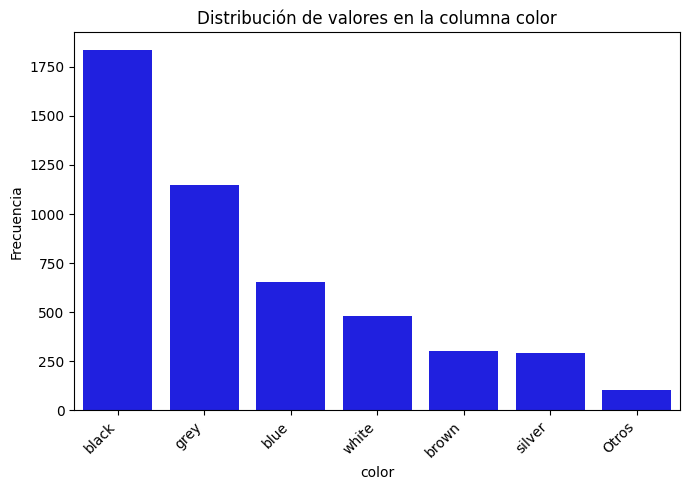

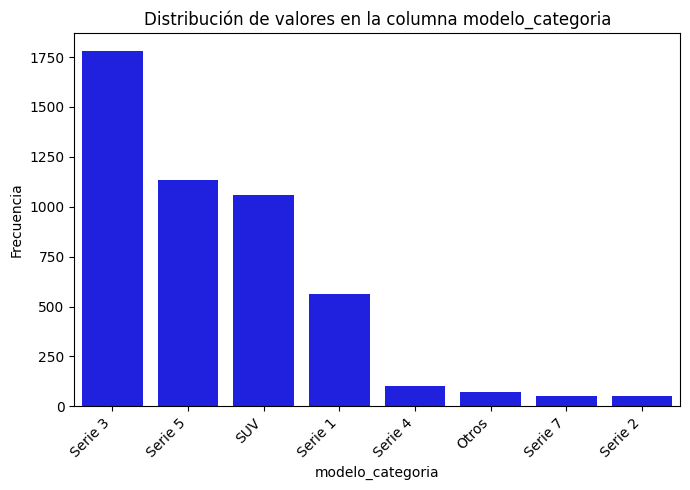

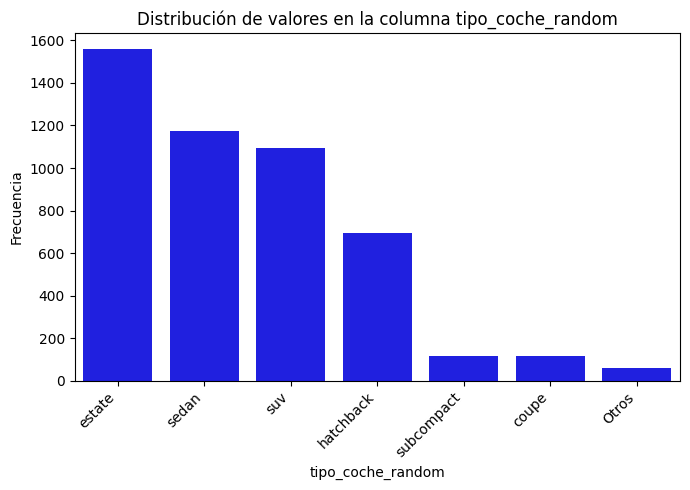

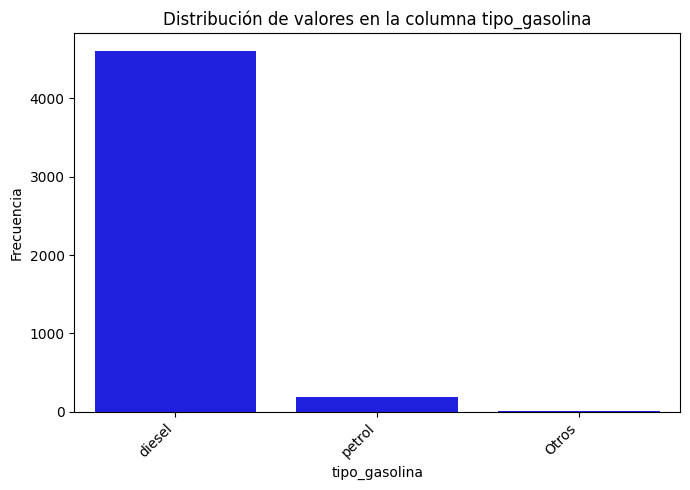

In [191]:
# Analizar las columnas categóricas del DataFrame 
analizar_categoricas(df_bmw_10, lista_categoricas) # f10

#### Resumen variables categoricas

Se ha reducido la cantidad de categorías, transformando en "Otros" todas las categorías con menos del 1% de frecuencia. Las columnas ahora tienen la siguiente cantidad de categorías/característica más vendida:

- modelo_categoria: 8 / Serie más vendida 3: 37%
- color: 7 / Color más vendido: negro (38.1%)
- tipo_coche_random: 7 / Tipo más vendido: estate (32,6%)
- tipo_gasolina: 3 / Combustible más vendido: diesel (95.7%)


## Análisis de correlación inicial

### Variables numéricas:

In [192]:
# Se obtienen las listas de variables numéricas, categóricas y booleanas del DataFrame `df_bmw_10`.
lista_numericas, lista_categoricas, lista_boolean = obtener_lista_variables(df_bmw_10, "")

Lista numéricas: ['aire_acondicionado', 'alerta_lim_velocidad', 'bluetooth', 'camara_trasera', 'elevalunas_electrico', 'fecha_registro_existe', 'fecha_venta_mes', 'gps', 'km', 'potencia', 'precio', 'volante_regulable']
Lista categóricas: ['color', 'modelo_categoria', 'tipo_coche_random', 'tipo_gasolina']
Lista booleanas: []


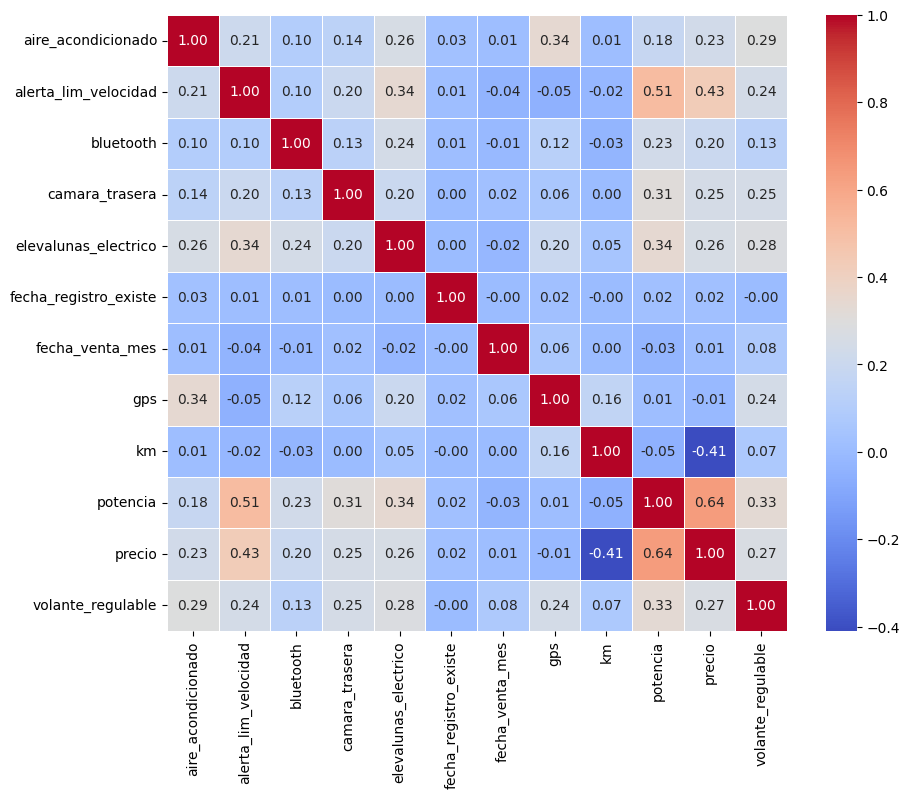

In [193]:
# Calcular y visualizar la matriz de correlación entre las variables numéricas
corr_n=visualizar_correlacion(df_bmw_10, lista_numericas) # f13

- **potencia** muestra una correlación positiva bastante significativa con **alerta_lim_velocidad** (0.51). La correlación es algo menor con **elevalunas_electrico** (0.34), **volante_regulable** (0.33) y **camara_trasera** (0.31), lo que indica que los vehículos con mayor potencia tienden a estar equipados con estos atributos.

- **aire_acondicionado** muestra una correlación moderada positiva con **gps** (0.34) y **volante_regulable** (0.26), sugiriendo que los vehículos con aire acondicionado también tienden a estar equipados con GPS y elevalunas eléctricos.


### Variables categóricas:

Coeficiente de Cramér's V entre variables categóricas:
                   color  modelo_categoria  tipo_coche_random  tipo_gasolina
color              1.000             0.090              0.061          0.043
modelo_categoria   0.090             1.000              0.404          0.201
tipo_coche_random  0.061             0.404              1.000          0.130
tipo_gasolina      0.043             0.201              0.130          1.000


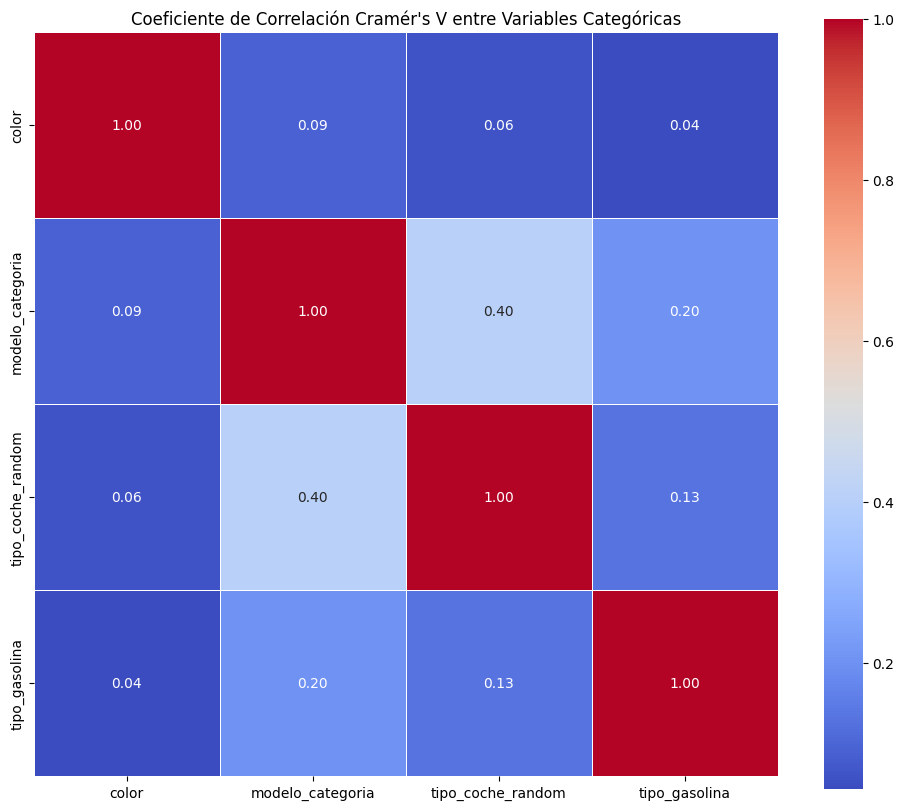

,color,modelo_categoria,tipo_coche_random,tipo_gasolina
color,1.000,0.090,0.061,0.043
modelo_categoria,0.090,1.000,0.404,0.201
tipo_coche_random,0.061,0.404,1.000,0.130
tipo_gasolina,0.043,0.201,0.130,1.000


In [194]:
# Cálculo y visualización de la matriz de correlación de Cramér's V entre variables categóricas
calcular_y_visualizar_cramers_v(df_bmw_10, lista_categoricas)  # f14

#### Resumen conclusiones

- **modelo_categoria** y **tipo_coche_random** (0,41): una asociación moderada.

- **modelo_categoria** y **tipo_gasolina** (0.20): una asociación mas baja.

## Análisis variable vs target

In [195]:
# Crear una copia profunda del DataFrame df_bmw_10
df_bmw_11 = df_bmw_10.copy(deep=True)

In [196]:
# Aplicar la transformación logarítmica a la columna 'precio' y crear una nueva columna 'precio_log'
df_bmw_11["precio_log"] = np.log10(df_bmw_11["precio"])

### Variables numericas

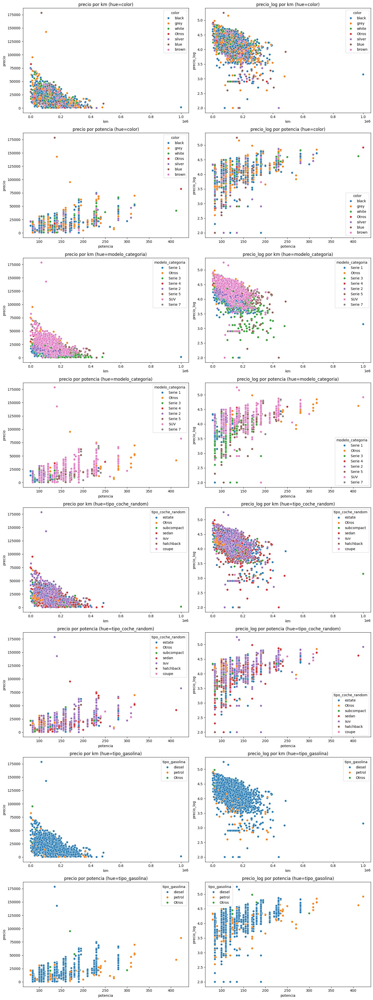

In [197]:
# Crear scatter plots para visualizar la relación entre las variables (km y potencia) y las variables objetivo (precio y precio_log),
# con diferenciación por las categorías especificadas.
crear_scatter_plots_log(df_bmw_11, ["km", "potencia"], ["precio", "precio_log"], lista_categoricas) # f15

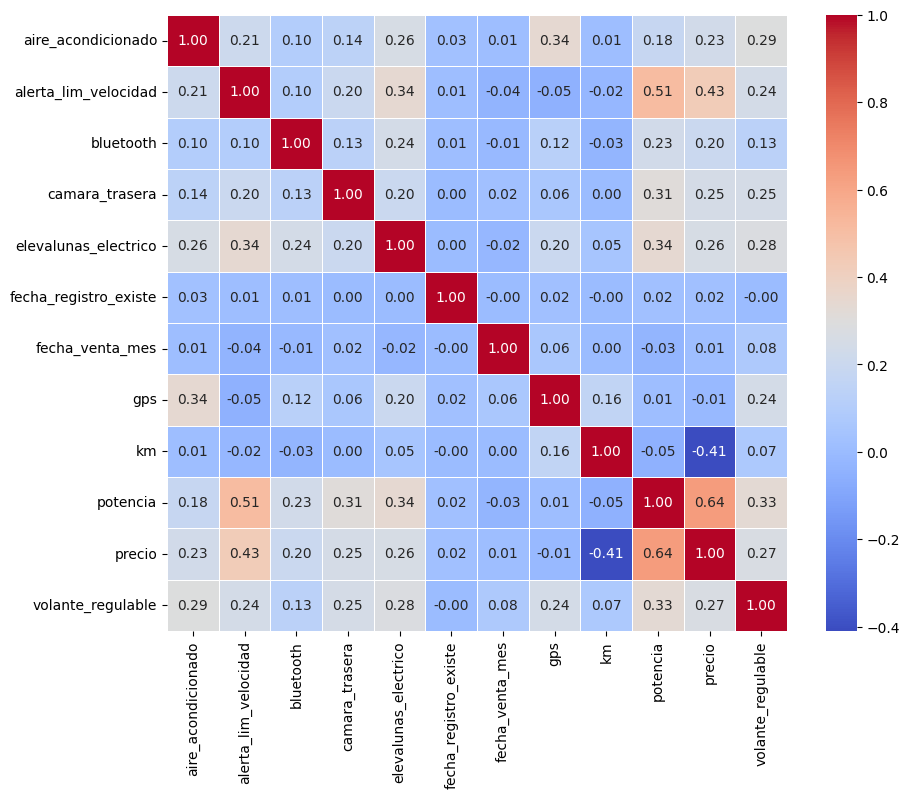

In [198]:
# Identificar relaciones lineales entre las diferentes características numéricas.
corr_v=visualizar_correlacion(df_bmw_11, lista_numericas)  # f13

#### Resumen conclusiones

##### Correlaciones destacadas

- **precio** y **potencia** (0.64):
  La correlación más fuerte indica que coches con mayor potencia suelen tener precios más altos.

- **precio** y **alerta_lim_velocidad** (0.43):
  Los vehículos con alerta de límite de velocidad suelen ser más caros.

- **precio** y **km** (-0.41):
  Coches con más kilómetros tienden a tener precios más bajos.

##### Correlaciones Moderadas

- **precio** y **volante_regulable** (0.27):
  Los coches con volante regulable tienen precios ligeramente más altos.

- **precio** y **elevalunas_electrico** (0.26):
  Los coches con elevalunas eléctricos pueden costar un poco más.

- **precio** y **camara_trasera** (0.25):
  Coches con cámara trasera suelen tener precios más altos.

##### Correlaciones Bajas

- **precio** y **aire_acondicionado** (0.23):
  Coches con aire acondicionado tienden a ser algo más caros.

- **precio** y **bluetooth** (0.20):
  La presencia de Bluetooth tiene un pequeño efecto positivo en el precio.

### Variables categoricas

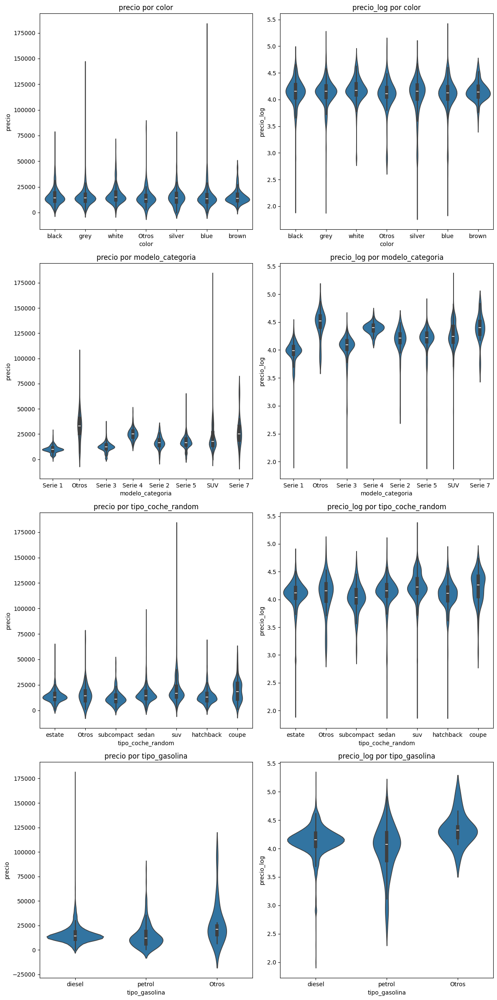

In [199]:
# Crear gráficos de violín para analizar la distribución de 'precio' y 'precio_log' en función de las columnas categóricas
crear_violinplot_log(df_bmw_11, lista_categoricas, ["precio", "precio_log"])  # f16

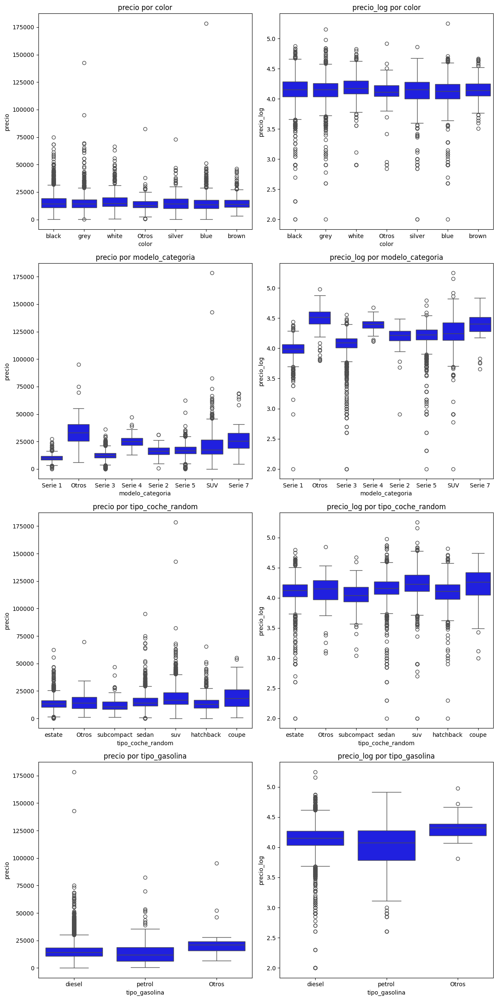

In [200]:
# Crear boxplots para comparar la distribución de 'precio' y 'precio_log' para cada categoría en las variables categóricas de 'lista_categoricas'.
crear_boxplot_log(df_bmw_11, lista_categoricas, ["precio", "precio_log"]) # f17

In [201]:
# Realizar un análisis ANOVA para evaluar la significancia de las diferencias en el precio entre diferentes categorías
# 'resultados_anova' almacenará los resultados estadísticos del ANOVA
# 'medias_por_categoria' contendrá las medias del precio para cada categoría
# 'rango_medias' mostrará el rango de las medias, ayudando a entender la variabilidad de los precios entre categorías
resultados_anova, medias_por_categoria, rango_medias = analisis_anova_y_medias_1(df_bmw_11, lista_categoricas, 'precio') # f18

Resultados de ANOVA:
  Columna Categórica   Valor F   p-Valor
0              color    3.6030  0.001443
1   modelo_categoria  273.7767  0.000000
2  tipo_coche_random   63.7859  0.000000
3      tipo_gasolina   14.3070  0.000001

Medias por Categoría:

color:
    color  Media Precio
0   Otros         14850
1   black         16029
2    blue         15347
3   brown         15546
4    grey         15607
5  silver         14872
6   white         17385

modelo_categoria:
  modelo_categoria  Media Precio
0            Otros         33424
1              SUV         21388
2          Serie 1          9983
3          Serie 2         16772
4          Serie 3         12167
5          Serie 4         25185
6          Serie 5         16777
7          Serie 7         28576

tipo_coche_random:
  tipo_coche_random  Media Precio
0             Otros         15697
1             coupe         19454
2            estate         13886
3         hatchback         14113
4             sedan         15574
5        su

In [202]:
# Mostrar rango de medias en formato de tabla
df_rango_medias=pd.DataFrame(rango_medias).T

In [203]:
# Rango de medias según variables categoricas
df_rango_medias

,Max Media Precio,Categoria Max,Min Media Precio,Categoria Min
color,17385,white,14850,Otros
modelo_categoria,33424,Otros,9983,Serie 1
tipo_coche_random,20033,suv,12362,subcompact
tipo_gasolina,27081,Otros,14398,petrol


En el análisis de ANOVA, los valores "F" y "p" son métricas clave utilizadas para evaluar la significancia estadística de las diferencias entre grupos.

**Valor F:** 
  - El valor F es una estadística utilizada para determinar si existen diferencias significativas entre las medias de los diferentes grupos. 
  - Cuanto mayor sea el valor F, mayor será la evidencia en contra de la hipótesis nula, que sostiene que todas las medias de los grupos son iguales.
  - Un valor F alto indica que la variabilidad entre los grupos es mayor que la variabilidad dentro de los grupos, sugiriendo que al menos uno de los grupos tiene una media significativamente diferente.

**p-Valor:**
  - El p-valor es la probabilidad de obtener un valor F al menos tan extremo como el observado, asumiendo que la hipótesis nula es verdadera.
  - Un p-valor bajo (por lo general, menor a 0.05) indica que es poco probable que las diferencias observadas sean producto del azar, lo que sugiere que las diferencias entre las medias de los grupos son estadísticamente significativas.
  - Un p-valor alto sugiere que no hay suficiente evidencia para rechazar la hipótesis nula, lo que implica que no hay diferencias significativas entre las medias de los grupos.

**Interpretación de los Resultados**

- **modelo_categoria (Valor F: 273.78, p-Valor: 0.000000), tipo_coche_random (Valor F: 68.31, p-Valor: 0.000000):** 

  Estos factores tienen valores F muy altos y p-valores extremadamente bajos (0.000000), lo que indica que estas categorías tienen un impacto muy significativo en el precio del coche.

- **tipo_gasolina (Valor F: 14.31, p-Valor: 0.000001):**

  También hay una diferencia significativa en los precios en función del tipo de gasolina que utiliza el coche.

- **color (Valor F: 3.60, p-Valor: 0.001443):** 

  Hay una diferencia significativa en los precios según el color del coche, dado que el p-valor es muy bajo.

#### Resumen conclusiones

- **color**: El blanco tiene el precio promedio más alto (17,385 euros), mientras que otros colores tienen el más bajo (14,850 euros).

- **modelo_categoria**: Los coches de la categoría "Otros" tienen el precio promedio más alto (33,424 euros), y "Serie 1" el más bajo (9,983 euros).

- **tipo_coche_random**: Los cupes son los más caros (21,036 euros), mientras que los subcompactos son los más baratos (12,499 euros).

- **tipo_gasolina**: Los coches con gasolina clasificada como "Otros" tienen el precio promedio más alto (27,081 euros), y los que usan gasolina estándar ("petrol") el más bajo (14,398 euros).

## Transformacion de columnas categoricas en numéricas

In [204]:
# Se crea una copia profunda del DataFrame original df_bmw_11.
df_bmw_12 = df_bmw_11.copy(deep=True)


In [205]:
# Lista de columnas para transformación.
lista_ohe=["fecha_venta_mes","tipo_coche_random","modelo_categoria","color","tipo_gasolina"]

In [206]:
# Aplicar One Hot Encoding a las columnas categóricas de 'lista_categoricas_moda' en el DataFrame df_bmw_12.
df_bmw_12 = one_hot_encoder(df_bmw_12, lista_ohe) #f19

# Identificar y convertirlas columnas booleanas del DataFrame df_bmw_12.
df_bmw_12 = identify_convert_boolean_columns(df_bmw_12) #f7

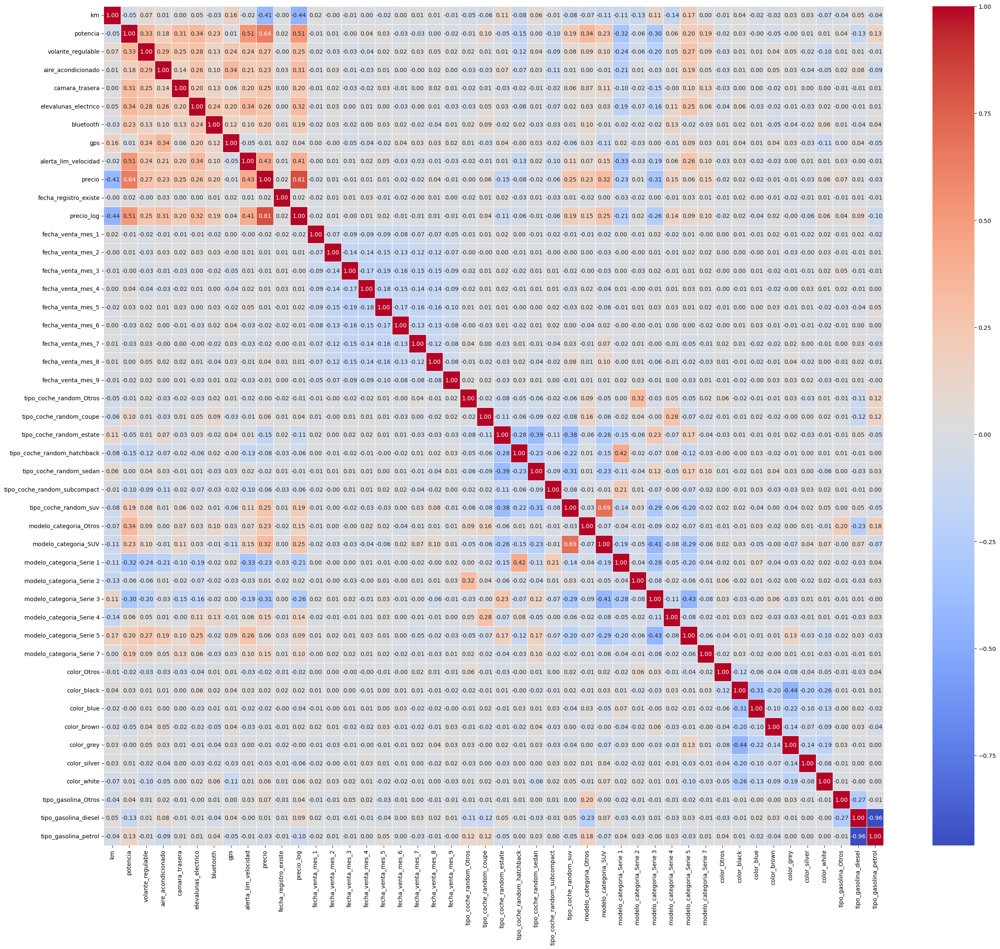

In [207]:
# Calcular y visualizar la matriz de correlación entre las variables numéricas
corr=visualizar_correlacion(df_bmw_12, df_bmw_12.columns, fig_width=30, fig_height=26, cmap='coolwarm', max_columns=46)# f13

### Resumen conclusiones

La correlación de 0.66 entre las variables tipo_coche_random_SUV y modelo_categoria_SUV indica una relación moderadamente fuerte y significativa. Sin embargo, dado que estas variables definen aspectos diferentes (una se refiere al tipo general de vehículo y la otra al modelo específico dentro de la categoría SUV), es razonable mantener ambas como características en el modelo, ya que aportan información complementaria. Aunque están correlacionadas, esta correlación no es tan alta como para justificar la eliminación de una de ellas, y podrían proporcionar un valor añadido al modelo si capturan diferentes facetas de la variabilidad de los datos.

Además, la correlación entre tipo_gasolina_diesel y tipo_gasolina_petrol es extremadamente alta, con un valor de 0.96. Dado que ambas columnas representan diferentes categorías del mismo parámetro tipo_gasolina creadas mediante One Hot Encoding, se ha decidido mantener ambas.

## Ajuste modelo 

Los escaladores deben aplicarse a los datos después de dividirlos en conjuntos de entrenamiento y prueba. Primero, se realiza la separación de los datos en estos conjuntos y luego se ajusta el modelo de regresión lineal utilizando el logaritmo del precio.

Al evaluar el rendimiento del modelo con el conjunto de datos de precios, hemos observado la presencia de valores atípicos. Por lo tanto, excluiremos de la consideración los valores que estén por debajo de 500 euros o por encima de 75,000 euros.

In [208]:
# Filtrar los datos para excluir los valores de precio atípicos
df_filtrado = df_bmw_12[(df_bmw_12['precio'] <= 75000) & (df_bmw_12['precio'] >= 500)]

# Reiniciar el índice del DataFrame 
df_filtrado=df_filtrado.reset_index(drop=True)

# Definir las columnas a excluir relacionadas con 'tipo_coche' si quisieramos mirar como afecta al modelo
#columns_exclude = df_bmw_12.filter(like="tipo_coche").columns.to_list()

# Seleccionar las características excluyendo las columnas especificadas
#X = df_filtrado.drop(columns=columns_exclude + ["precio", "precio_log"], axis=1)
X = df_filtrado.drop(columns=["precio", "precio_log"], axis=1)

# Seleccionar la variable objetivo que queremos predecir
y = df_filtrado['precio_log']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=8)


In [209]:
# Inicializar el escalador
scaler = MinMaxScaler()

# Copiar los datos
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

# Definir las columnas a escalar
columnas_escalar = ["km", "potencia"]

# Ajustar el escalador solo con el conjunto de entrenamiento
scaler.fit(X_train[columnas_escalar])

# Transformar el conjunto de entrenamiento y el conjunto de prueba
X_train_scaled[columnas_escalar] = scaler.transform(X_train[columnas_escalar])
X_test_scaled[columnas_escalar] = scaler.transform(X_test[columnas_escalar])

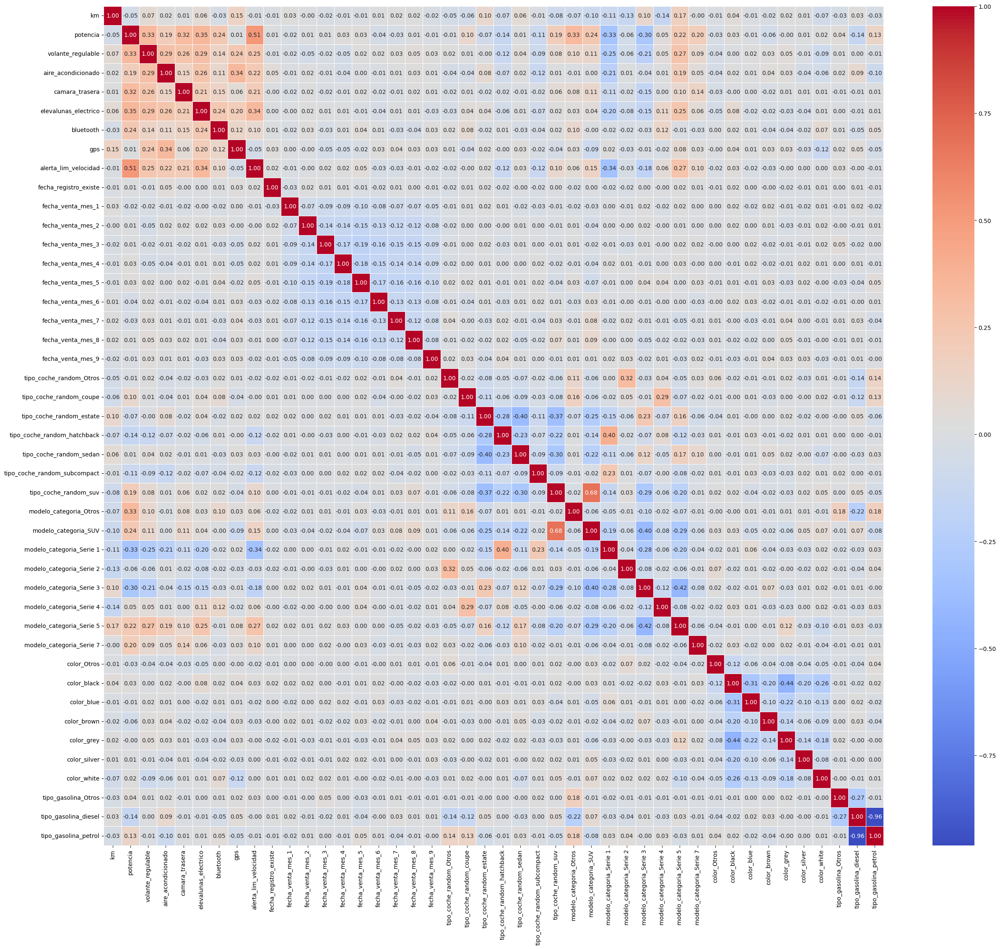

In [210]:
# Visualizar la matriz de correlación de las características del conjunto de entrenamiento escalado
cor=visualizar_correlacion(X_train_scaled, X_train_scaled.columns, fig_width=30, fig_height=26, cmap='coolwarm', max_columns=46)

Ajuste modelo de regresión lineal

In [211]:
# Crear una instancia del modelo de regresión lineal
LR = LinearRegression()

# Ajustar el modelo con los datos de entrenamiento escalados
LR.fit(X_train_scaled, y_train)

# Predecir los valores de precio en la escala logarítmica para el conjunto de prueba
y_pred_log = LR.predict(X_test_scaled)

# Transformar las predicciones y los valores reales desde la escala logarítmica (base 10) a euros
y_pred = 10 ** y_pred_log
y_test_euros = 10 ** y_test

# Calcular MSE, RMSE y R² para el modelo logarítmico (base 10)
mse_log = mean_squared_error(y_test, y_pred_log)
rmse_log = np.sqrt(mse_log)
r2_log = r2_score(y_test, y_pred_log)

# Calcular MSE, RMSE y R² para los valores en euros
mse_euros = mean_squared_error(y_test_euros, y_pred)
rmse_euros = np.sqrt(mse_euros)
r2_euros = r2_score(y_test_euros, y_pred)

# Crear un DataFrame para mostrar las métricas con valores redondeados
metrics_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'R²'],
    'Escala Logarítmica': [round(mse_log, 2), round(rmse_log, 2), round(r2_log, 2)],
    'Valores en Euros': [round(mse_euros, 2), round(rmse_euros, 2), round(r2_euros, 2)]
})

# Imprimir la tabla con las métricas
print("Comparación de Métricas del Modelo:")
print(metrics_df)

# Crear un DataFrame para comparar las predicciones con los valores reales en euros
result_df = pd.DataFrame({
    'Predicción (Euros)': y_pred,
    'Real (Euros)': y_test_euros
})

# Imprimir el DataFrame con las predicciones y los valores reales
print("\nComparación de Predicciones y Valores Reales:")
print(result_df.head())

Comparación de Métricas del Modelo:
  Métrica  Escala Logarítmica  Valores en Euros
0     MSE                0.03       19783352.65
1    RMSE                0.17           4447.85
2      R²                0.55              0.72

Comparación de Predicciones y Valores Reales:
      Predicción (Euros)  Real (Euros)
2273        46346.359388       35700.0
1383        18864.042475       21100.0
435         14614.868830       15400.0
3860        15082.272976       10900.0
3861        22658.158442       17700.0


Filtrar los precios en el rango de 500 a 75,000 euros para eliminar valores atípicos permite que el modelo de regresión lineal explique el 72% de la variabilidad en los datos. Dado que aún no conocemos en profundidad los modelos posibles, mantenemos el DataFrame resultante de estos cambios como df_final.

In [212]:
# Definimos Data Frame final
df_final = df_filtrado 

# Mostrar información sobre el DataFrame final, como el número de entradas y tipos de datos
# Esto nos permite verificar que las columnas excluidas se han eliminado correctamente
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4795 entries, 0 to 4794
Data columns (total 46 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   km                            4795 non-null   float64
 1   potencia                      4795 non-null   float64
 2   volante_regulable             4795 non-null   int8   
 3   aire_acondicionado            4795 non-null   int8   
 4   camara_trasera                4795 non-null   int8   
 5   elevalunas_electrico          4795 non-null   int8   
 6   bluetooth                     4795 non-null   int8   
 7   gps                           4795 non-null   int8   
 8   alerta_lim_velocidad          4795 non-null   int8   
 9   precio                        4795 non-null   float64
 10  fecha_registro_existe         4795 non-null   int8   
 11  precio_log                    4795 non-null   float64
 12  fecha_venta_mes_1             4795 non-null   int8   
 13  fec

In [213]:
# Inicializar el escalador
scaler_fin = MinMaxScaler()

# Copiar el DataFrame para aplicar el escalado
df_final_scaled = df_final.copy()

# Columnas a escalar
columnas_escalar = ["km", "potencia"]

# Ajustar el escalador con los datos de df_fin
scaler_fin.fit(df_final[columnas_escalar])

# Transformar las columnas especificadas en el DataFrame copiado
df_final_scaled[columnas_escalar] = scaler_fin.transform(df_final_scaled[columnas_escalar])

# Verificar el resultado
df_final_scaled.head(5)

,km,potencia,volante_regulable,aire_acondicionado,camara_trasera,elevalunas_electrico,bluetooth,gps,alerta_lim_velocidad,precio,fecha_registro_existe,precio_log,fecha_venta_mes_1,fecha_venta_mes_2,fecha_venta_mes_3,fecha_venta_mes_4,fecha_venta_mes_5,fecha_venta_mes_6,fecha_venta_mes_7,fecha_venta_mes_8,fecha_venta_mes_9,tipo_coche_random_Otros,tipo_coche_random_coupe,tipo_coche_random_estate,tipo_coche_random_hatchback,tipo_coche_random_sedan,tipo_coche_random_subcompact,tipo_coche_random_suv,modelo_categoria_Otros,modelo_categoria_SUV,modelo_categoria_Serie 1,modelo_categoria_Serie 2,modelo_categoria_Serie 3,modelo_categoria_Serie 4,modelo_categoria_Serie 5,modelo_categoria_Serie 7,color_Otros,color_black,color_blue,color_brown,color_grey,color_silver,color_white,tipo_gasolina_Otros,tipo_gasolina_diesel,tipo_gasolina_petrol
0,0.140358,0.060241,1,1,0,1,0,1,0,11300.0,1,4.053078,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
1,0.013924,0.713855,1,1,0,0,1,1,1,69700.0,0,4.843233,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2,0.183228,0.120482,0,0,0,1,0,1,0,10200.0,1,4.008600,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
3,0.127987,0.165663,1,1,0,1,1,1,1,25100.0,0,4.399674,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
4,0.097061,0.240964,1,1,0,0,1,1,1,33400.0,0,4.523746,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0


# Respuestas a las preguntas

## Pregunta 1

 ¿Qué columnas eliminaron inicialmente del dataset y por qué?

Se han eliminado las siguientes columnas:
- marca: porque el fichero contiene datos exclusivamente de BMW y esta columna no aporta nada al análisis.
- fecha_registro: tiene un 50% de valores NaN, lo cual hace que rellenarla no sea práctico ni significativo. En su lugar, se ha añadido la columna 'fecha_registro_existe', que indica con un valor booleano (True o False) si había datos en la columna de fecha de registro en el conjunto de datos inicial.
- la columna fecha_venta se desglosó en las columnas año, mes, día, día de la semana y trimestre. Posteriormente, se eliminaron las columnas fecha_venta_año, fecha_venta_día, fecha_venta_trimestre y fecha_nombre_semana tras el análisis, ya que la columna fecha_venta_día contenía solo un valor, las columnas fecha_venta_año para los años 2007-2010 contenían solo un valor por año, fecha_venta_mes y fecha_nombre_semana estaban altamente correlacionadas. Asimismo, eliminamos la columna fecha_venta_trimestre por tener solo 3 valores únicos y estar relacionada con fecha_venta_mes.
- la columna asientos_traseros_plegables tiene aproximadamente un 70% de valores nulos y no es una característica clave para el modelo.

Se han eliminado las siguientes filas:
- Correspondientes a los años 2007-2010, ya que solo había una fila por año que no aportaba nada al análisis.
- Fila con valor nulo en la fecha de venta porque puede corresponder a un año que no está en consideración.
- Al evaluar el rendimiento del modelo con el conjunto de datos de precios, hemos observado la presencia de valores atípicos. Por lo tanto, excluiremos de la consideración los valores que estén por debajo de 500 euros o por encima de 75,000 euros.

## Pregunta 2

Manejo de nulos, explicar qué se hizo con los nulos por cada columna 

### Tratamiento de nulos con menos de 1% de NaN:

Se eliminan 25 filas correspondientes a 8 columnas tras evaluar cada parámetro, ya que la cantidad de datos es limitada y no es posible imputarlos con precisión. Es preferible eliminarlas para evitar introducir distorsiones en el análisis.

- modelo (eliminadas 3 filas): es una característica principal de cualquier coche y no se puede deducir del resto de los datos.
- km (eliminadas 2 filas): es una característica del uso individual de cada coche y no se puede deducir del resto.
- potencia (eliminadas 1 fila): se ha observado que el modelo 525 puede tener varias potencias.
- tipo_gasolina (eliminadas 5 filas): se ha observado que no se puede determinar exactamente según el modelo.
- volante_regulable (eliminadas 4 filas): se ha observado que no se puede determinar exactamente según el modelo.
- camara_trasera (eliminadas 2 filas): se ha observado que no se puede determinar exactamente según el modelo.
- elevalunas_electrico (eliminadas 2 filas): se ha observado que no se puede determinar exactamente según el modelo.
- precio (eliminadas 6 filas): siendo la columna objetivo, es mejor no distorsionar los datos iniciales y no imputar valores para solo 6 filas de datos.




### Tratamiento de nulos con más de 9% NaN

Columnas:
- color 
- tipo_coche 
- aire_acondicionado
- bluetooth
- alerta_lim_velocidad 

Se hipotetiza que la distribución de valores nulos en las siguientes columnas podría estar relacionada con el modelo del vehículo. Se agrupan los datos por el modelo, se busca el valor más frecuente dentro de cada grupo para rellenar los nulos; si no se encuentra un valor de moda para el grupo, se usa el valor más frecuente de la columna en cuestión para el relleno.

Al comparar las distribuciones antes y después del relleno, se observa que tipo_coche se distorsiona significativamente. Se crea una distribución sintética aleatoria para mantener la distribución original. 

Nueva columna
- tipo_coche_random

## Pregunta 3

Analysis univarible, explicar alguna información interesante encontrada

### Variables numéricas:

1. **km:** la presencia de un valor mínimo negativo sugería errores en los datos que deberían ser corregidos; se cambió a 0 kilómetros ya que el vehículo parece ser nuevo.
2. **potencia:** Se reemplazaron los valores inferiores a 80 por la moda correspondiente, agrupando por modelo. Si no había suficientes datos para calcular la moda por modelo, se utilizó el valor más frecuente de la columna. Para el modelo 114, se imputó un valor fijo de 102.
3. **precio:** Existen valores atípicos muy altos (mayores de 75,000), que podrían deberse a características especiales del vehículo, como haber pertenecido a una persona famosa. También hay valores muy bajos (menores de 500), que podrían indicar vehículos con muchos kilómetros o una venta urgente a bajo precio. Se decide descartar los valores atipicos.
4. **fecha venta por mes:** Solo hay datos de 9 meses y la mayor parte de las ventas se realizaron en mayo y marzo.
   
**Columnas binarias:**

5. **aire_condicionado:** la mayoría (82%) de los vehículos tienen aire acondicionado.
6. **alerta_lim_velocidad:** proximadamente el 56% de los vehículos tienen esta característica.
7. **bluetooth:** el 21% de los vehículos están equipados con Bluetooth.
8. **camara_trasera :** solo el 20% de los vehículos tienen cámara trasera.
9. **elevalunas_electrico:** el 46% de los vehículos tienen elevalunas eléctricos.
10. **fecha_registro_existe:** la mitad de los vehículos tienen fecha de registro disponible.
11. **gps:** la mayoría (93%) de los vehículos cuentan con GPS.
12. **volante_regulable:** Aproximadamente el 55% de los vehículos tienen volante regulable.

### Variables categoricas:

Se ha reducido la cantidad de categorías, transformando en "Otros" todas las categorías con menos del 1% de frecuencia. 
Las columnas ahora tienen la siguiente cantidad de categorías/característica más vendida:

13. **modelo_categoria**: 8 / Serie más vendida 3: 37%
15. **color**: 7 / Color más vendido: negro (38.1%)
16. **tipo_coche_random**: 7 / Tipo más vendido: estate (32.6%)
18. **tipo_gasolina**: 3 / Combustible más vendido: diesel (95.7%)

## Pregunta 4

Análisis de correlación inicial, ¿Hay alguna variable correlacionada?

### Variables numericas:

- **potencia** muestra una correlación positiva bastante significativa con **alerta_lim_velocidad** (0.51). La correlación es algo menor con **elevalunas_electrico** (0.34), **volante_regulable** (0.33) y **camara_trasera** (0.31), lo que indica que los vehículos con mayor potencia tienden a estar equipados con estos atributos.
- **aire_acondicionado** muestra una correlación moderada positiva con **gps** (0.34) y **volante_regulable** (0.26), sugiriendo que los vehículos con aire acondicionado también tienden a estar equipados con GPS y elevalunas eléctricos.


### Variables categóricas:

- **modelo_categoria** y **tipo_coche_random** (0,41): una asociación moderada.
- **modelo_categoria** y **tipo_gasolina** (0.20): una asociación mas baja.

## Pregunta 5

Análisis variable vs target, ¿Hay algún insight interesante?

### Variables numéricas:

#### Correlaciones destacadas

- **precio** y **potencia** (0.64):
  La correlación más fuerte indica que coches con mayor potencia suelen tener precios más altos.

- **precio** y **alerta_lim_velocidad** (0.43):
  Los vehículos con alerta de límite de velocidad suelen ser más caros.

- **precio** y **km** (-0.41):
  Coches con más kilómetros tienden a tener precios más bajos.

#### Correlaciones Moderadas

- **precio** y **volante_regulable** (0.27):
  Los coches con volante regulable tienen precios ligeramente más altos.

- **precio** y **elevalunas_electrico** (0.26):
  Los coches con elevalunas eléctricos pueden costar un poco más.

- **precio** y **camara_trasera** (0.25):
  Coches con cámara trasera suelen tener precios más altos.

#### Correlaciones Bajas

- **precio** y **aire_acondicionado** (0.23):
  Coches con aire acondicionado tienden a ser algo más caros.

- **precio** y **bluetooth** (0.20):
  La presencia de Bluetooth tiene un pequeño efecto positivo en el precio.

### Variables categóricas:

- **color**: El blanco tiene el precio promedio más alto (17,385 euros), mientras que otros colores tienen el más bajo (14,850 euros).

- **modelo_categoria**: Los coches de la categoría "Otros" tienen el precio promedio más alto (33,424 euros), y "Serie 1" el más bajo (9,983 euros).

- **tipo_coche_random**: Los cupes son los más caros (21,036 euros), mientras que los subcompactos son los más baratos (12,499 euros).

- **tipo_gasolina**: Los coches con gasolina clasificada como "Otros" tienen el precio promedio más alto (27,081 euros), y los que usan gasolina estándar ("petrol") el más bajo (14,398 euros).


## Pregunta 6

Transformación de categóricas a numéricas, ¿Qué variables van a transformar? ¿Que técnica se va usar?

**Variables**: 'color', 'modelo_categoria', 'tipo_gasolina', 'fecha_venta_mes', 'tipo_coche_random'

**Técnica**: One-Hot Encoding

**Explicación**: Se aplica One-Hot Encoding porque las variables consideradas no tienen un orden intrínseco y no contienen demasiadas categorías.

## Pregunta 7

Escalar variables (usando minmaxscaler) y luego aplicar la correlación final de variables ¿Hay alguna variable finalmente correlacionada?

Hemos ajustado el modelo de regresión lineal escalando las variables **km** y **potencia**. Tras evaluar el rendimiento, concluimos que la mejor estrategia es excluir los datos de **precio** superiores a 75,000 euros y inferiores a 500 euros. Estas modificaciones nos permiten explicar el 72% de la variabilidad de los datos. 

La correlación de 0.66 entre las variables tipo_coche_random_SUV y modelo_categoria_SUV indica una relación moderadamente fuerte y significativa. Sin embargo, dado que estas variables definen aspectos diferentes (una se refiere al tipo general de vehículo y la otra al modelo específico dentro de la categoría SUV), es razonable mantener ambas como características en el modelo, ya que aportan información complementaria. Aunque están correlacionadas, esta correlación no es tan alta como para justificar la eliminación de una de ellas, y podrían proporcionar un valor añadido al modelo si capturan diferentes facetas de la variabilidad de los datos.

Además, la correlación entre tipo_gasolina_diesel y tipo_gasolina_petrol es extremadamente alta, con un valor de 0.96. Dado que ambas columnas representan diferentes categorías del mismo parámetro tipo_gasolina creadas mediante One Hot Encoding, se ha decidido mantener ambas.

## Pregunta 8

Subir un pantallazo con el nombre de TODAS las columnas que tiene el dataframe final final vfin y el tipo de dato que tiene, tip lo más sencillo es hacer un .info al dataframe y tomarle un pantallazo y subirlo, importante deben aparecer TODAS las columnas

In [214]:
df_final_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4795 entries, 0 to 4794
Data columns (total 46 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   km                            4795 non-null   float64
 1   potencia                      4795 non-null   float64
 2   volante_regulable             4795 non-null   int8   
 3   aire_acondicionado            4795 non-null   int8   
 4   camara_trasera                4795 non-null   int8   
 5   elevalunas_electrico          4795 non-null   int8   
 6   bluetooth                     4795 non-null   int8   
 7   gps                           4795 non-null   int8   
 8   alerta_lim_velocidad          4795 non-null   int8   
 9   precio                        4795 non-null   float64
 10  fecha_registro_existe         4795 non-null   int8   
 11  precio_log                    4795 non-null   float64
 12  fecha_venta_mes_1             4795 non-null   int8   
 13  fec

## Pregunta 9

Exportar en un excel de las primeras 50 filas del dataset (df.to_excel(...)

Guardar el archivo en formato pickle y también exportar las primeras 50 filas a un archivo Excel

In [215]:
# Ruta para guardar el archivo pickle
pickle_path = 'df_final_scaled.pkl'

# Ruta para guardar el archivo Excel
excel_path = 'df_final_scaled.xlsx'

# Guardar el DataFrame en un archivo pickle usando pandas
df_final_scaled.to_pickle(pickle_path)

# Guardar las primeras 50 filas en un archivo Excel usando pandas
df_final_scaled.head(50).to_excel(excel_path, index=False)